In [1]:
import math
import numpy as np
import imageio.v3 as iio
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import interpolate
from scipy import integrate
from scipy.optimize import minimize
import time
from numba import jit
import cv2

In [2]:
import matplotlib as mpl
mpl.rcParams['font.size'] = 12
plt.rcParams["font.family"] = "Times New Roman"

In [3]:
# mpl.rcParams.update(mpl.rcParamsDefault)


# Utility Functions

In [4]:
def reflectivity_MSE_db(estimate, truth):
    # method to calculate the Mean Squared Error of the estimated reflectivity compared to the true reflectivity in dB
    row_num = len(truth)
    col_num = len(truth[0])
    mse_sum = 0
    for i in range(row_num):
        for j in range(col_num):
            mse_sum += (truth[i][j] - estimate[i][j])**2
    return 10*np.log10(mse_sum/(row_num*col_num))

In [5]:
def depth_RMSE(estimate, truth):
    # method to calculate the Root Mean Square Error of the estimated depth compared to the true depth in meters
    return np.mean(np.square(truth - estimate))

In [6]:
def cap_scale(estimate, high_cap=1.0, low_cap=0.0, offset=0.0, range=1.0):
    cutoff = np.maximum(np.minimum(estimate, high_cap), low_cap)
    return range*(cutoff-low_cap)/(high_cap - low_cap) + offset

# Loading in the Scenes: Art and Bowling


In [7]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

## Art

(555, 695)


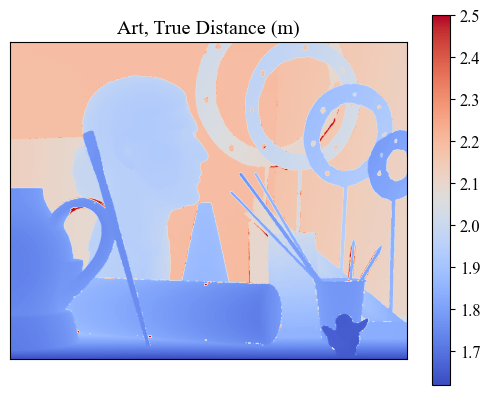

In [8]:
art_z = iio.imread('ArtnBowl/art_disp1.png')
art_z = 1.5 + (- art_z + 255)/255
art_z = cv2.resize(art_z, (0,0), fx=0.5, fy=0.5) 
print(art_z.shape)
plt.imshow(art_z, cmap=plt.get_cmap("coolwarm"))
plt.colorbar()
plt.title("Art, True Distance (m)")
plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelleft=False,
    labelbottom=False) # labels along the bottom edge are off
plt.show()

(555, 695)


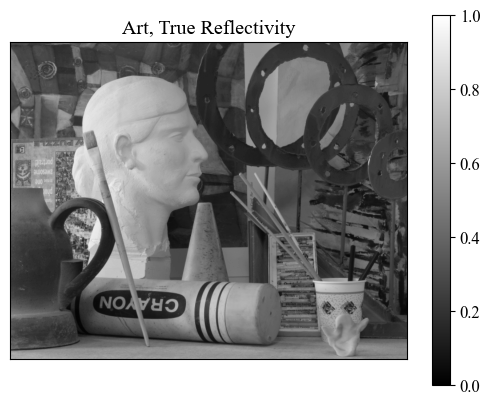

In [9]:
art_alpha = iio.imread('ArtnBowl/art_view1.png')
art_alpha = rgb2gray(art_alpha)/255
art_alpha = cv2.resize(art_alpha, (0,0), fx=0.5, fy=0.5) 
print(art_alpha.shape)
plt.imshow(art_alpha, vmin=0, vmax=1, cmap=plt.get_cmap("gray"))
plt.colorbar()
plt.title("Art, True Reflectivity")
plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelleft=False,
    labelbottom=False) # labels along the bottom edge are off
plt.show()

## Bowling

(555, 626)


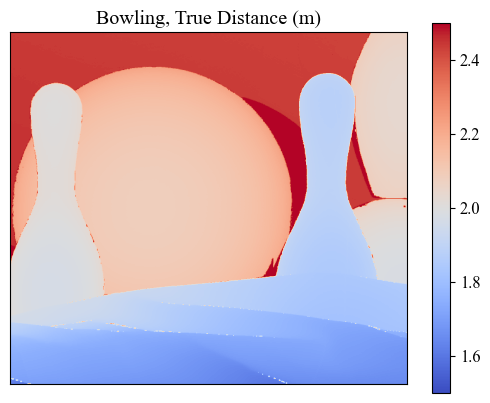

In [10]:
bowl_z = iio.imread('ArtnBowl/bowl_disp1.png')
bowl_z = 1.5 + (- bowl_z + 255)/255
bowl_z = cv2.resize(bowl_z, (0,0), fx=0.5, fy=0.5) 
print(bowl_z.shape)
plt.imshow(bowl_z, vmin=1.5, vmax=2.5, cmap=plt.get_cmap("coolwarm"))
plt.colorbar()
plt.title("Bowling, True Distance (m)")
plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelleft=False,
    labelbottom=False) # labels along the bottom edge are off
plt.show()

(555, 626)


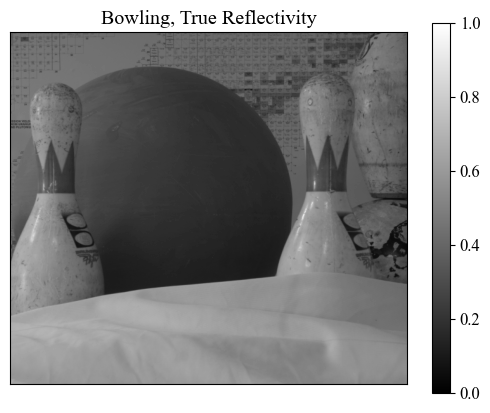

In [11]:
bowl_alpha = iio.imread('ArtnBowl/bowl_view1.png')
bowl_alpha = rgb2gray(bowl_alpha)/255
bowl_alpha = cv2.resize(bowl_alpha, (0,0), fx=0.5, fy=0.5) 
print(bowl_alpha.shape)
plt.imshow(bowl_alpha, cmap=plt.get_cmap("gray"), vmin=0.0, vmax=1.0)
plt.colorbar()
plt.title("Bowling, True Reflectivity")
plt.tick_params(
    axis='both',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    left=False,
    right=False,
    labelleft=False,
    labelbottom=False) # labels along the bottom edge are off
plt.show()

# Physically accurate simulation

We will use a pulse width $T_p = 270 $ ps, and repetition period $T_r = 100$ ns.
Quantum efficiency $\eta = 0.35$.

In Rapp's simulation, scenes were simulated so that the average pixel would require $500$ illuminations to generate one signal photon. This means the signal photon count is $\eta \bar{\alpha} S = 1/500 = 0.002$ counts per pulse.

Then, $S = 0.002/(\eta \bar{\alpha}) = 0.0114$ counts per pulse.

In [12]:
# defining the constants
T_p = 270E-12/2
T_r = 100E-9
eta = 0.35
c=3E8
S = 0.0114

In [13]:
def gaussian(x, mu, sig, A):
    return A*(
        1.0 / (np.sqrt(2.0 * np.pi) * sig) * np.exp(-np.power((x - mu) / sig, 2.0) / 2)
    )

The mean is selected to be $T_r / 2$, i.e. the center of the period of the pulse. Note: the definition of $T_p$ in the paper is defined as the width of the pulse, which is $2\sigma$. Here, for easy calculation, I put $T_p = 270/2 = 135$ ps.

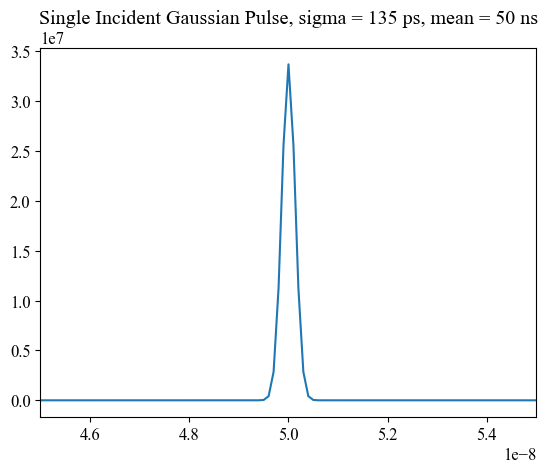

In [14]:
incident_t = np.arange(0, T_r, T_r/1000)
plt.plot(incident_t, gaussian(incident_t, T_r/2, T_p, S))
plt.title("Single Incident Gaussian Pulse, sigma = 135 ps, mean = 50 ns")
plt.xlim([0.45E-7, 0.55E-7])
plt.show()

# Rapp's Simulation Conditions

Rapp's experiments consist of two sets of tests:

#### Set A: Use SBR as independent variable, and compare the MSE (dB) and RMSE (m) of these algorithms:
1. Oracle, Signal photon counts per pixel (sppp) = 2
2. Oracle, sppp = 3
3. Shin, sppp = 2
4. Shin, sppp = 3
5. Rapp, sppp = 2
6. Rapp, sppp = 3

The SBR values tested are: **[0.01, 0.02, 0.035, 0.06, 0.1, 0.2, 0.35, 0.6, 1.0]**

#### Set B: Use signal photon counts per pixel (sppp) as independent variable, and compare the MSE (dB) and RMSE (m) of these algorithms:
1. Oracle
2. Shin, SBR = 0.1
3. Shin, SBR = 1
4. Rapp, SBR = 0.1
5. Rapp, SBR = 1

The sppp values tested are: **[0.1, 0.2, 0.35, 0.6, 1.0, 2.0, 3.5, 6.0, 10.0]**

To generate sppp = 2, we simply need $500 \times 2 = 1000$ pulses. For sppp = 3, we need $1500$ pulses.

In [15]:
bowl_alpha_avg = np.mean(bowl_alpha)
art_alpha_avg = np.mean(art_alpha)

In [16]:
def find_B(alpha_scene_avg, SBR): # a function to calculate B
    return eta*alpha_scene_avg*S/SBR

In [17]:
SBR_arr = [0.1, 1.0]

In [18]:
B_art_arr = [find_B(art_alpha_avg, sbr) for sbr in SBR_arr]

In [19]:
B_art_arr

[0.015317909004513882, 0.0015317909004513883]

In [20]:
B_bowl_arr = [find_B(bowl_alpha_avg, sbr) for sbr in SBR_arr]

In [21]:
B_bowl_arr

[0.01569550709221875, 0.0015695507092218753]

# Simulating the rate function

## Combined Code for Generating Timestamps

In [22]:
import os

In [23]:
def generate_timestamp_save(dist_image, reflect_image, N, B, sppp, path_str):
    row_num = len(dist_image)
    col_num = len(dist_image[0])

    timestamps_matrix = np.empty((row_num, col_num, N)) # N pulses

    P0 = np.exp(-(eta*reflect_image*S + B)) # probability of detecting 0 photons
    P1 = 1 - P0 # probability of detecting 1 photon

    P_bgd = B/(eta*reflect_image*S + B) # given that 1 photon is detected, the probability that it is due to background
    
    for i in range(N):
        success_m = np.random.binomial(1, P1, size=(row_num, col_num)) # successfully detecting 1 photon during that single-pulse period

        bgd_m = np.random.binomial(1, P_bgd, size=(row_num, col_num)) # detecting background

        bgd_ts = np.random.uniform(low=T_r/2, high=3*T_r/2, size=(row_num, col_num)) # background timestamps, uniformly distributed over [T_r/2, 3T_r/2]
        sgl_ts = np.random.normal(loc=T_r/2 + 2*dist_image/c, scale=T_p, size=(row_num, col_num)) # signal timestamps, normal distribution with mean = T_r/2 + 2*dist_image/c, STD = T_p
        ts_m = (1-bgd_m)*sgl_ts + bgd_m*bgd_ts # combining the timestamps

        hist_m = ts_m*success_m # combining timestamps with no detections
        hist_m[hist_m==0] = np.nan # imputing 0 as np.NaN

        timestamps_matrix[:,:,i] = hist_m

        path_str_frame = f"sppp{str(int(sppp*1000)).zfill(4)}_fr{str(i).zfill(4)}.csv"

        # mypath =  + path_str_frame
        if not os.path.isdir(path_str):
            os.makedirs(path_str)

        np.savetxt(path_str+path_str_frame, hist_m, delimiter=",")
    
    return timestamps_matrix

In [24]:
sppp_arr = [0.1, 0.2, 0.35, 0.6, 1.0, 2.0, 3.0, 3.5, 6.0, 10.0]

In [25]:
rslt = generate_timestamp_save(bowl_z, bowl_alpha, int(500*10.0), 0, 3, f"bowl_sbrmax_sppp{str(int(10.0*1000)).zfill(4)}/")

In [26]:
for sppp in sppp_arr:
    rslt = generate_timestamp_save(art_z, art_alpha, int(500*sppp), 0, 3, f"art_sbrmax_sppp{str(int(sppp*1000)).zfill(4)}/")

In [18]:
N_arr = [sppp*500 for sppp in sppp_arr]

In [19]:
N_arr

[50.0, 100.0, 175.0, 300.0, 500.0, 1000.0, 1750.0, 3000.0, 5000.0]

In [30]:
for i in range(9):
    bowl_sbr0100_arr = generate_timestamp_save(bowl_z, bowl_alpha, int(N_arr[i]), B_bowl_arr[0], sppp_arr[i], f"bowl_sbr0100_sppp{str(int(sppp_arr[i]*1000)).zfill(4)}/")

In [31]:
for i in range(9):
    bowl_sbr1000_arr = generate_timestamp_save(bowl_z, bowl_alpha, int(N_arr[i]), B_bowl_arr[1], sppp_arr[i], f"bowl_sbr1000_sppp{str(int(sppp_arr[i]*1000)).zfill(4)}/")

In [32]:
for i in range(9):
    art_sbr0100_arr = generate_timestamp_save(art_z, art_alpha, int(N_arr[i]), B_art_arr[0], sppp_arr[i], f"art_sbr0100_sppp{str(int(sppp_arr[i]*1000)).zfill(4)}/")

: 

In [26]:
for i in range(7, 9):
    art_sbr1000_arr = generate_timestamp_save(art_z, art_alpha, int(N_arr[i]), B_art_arr[1], sppp_arr[i], f"art_sbr1000_sppp{str(int(sppp_arr[i]*1000)).zfill(4)}/")

In [95]:
for i in range(9):
    bowl_sppp3_arr = generate_timestamp_save(bowl_z, 
                                             bowl_alpha, 
                                             1500, 
                                             B_bowl_arr[i], 
                                             SBR_arr[i], 
                                             f"bowl_sppp3_sbr{str(int(SBR_arr[i]*1000)).zfill(4)}/")

In [104]:
for i in range(9):
    art_sppp3_arr = generate_timestamp_save(art_z, 
                                             art_alpha, 
                                             1500, 
                                             B_art_arr[i], 
                                             SBR_arr[i], 
                                             f"art_sppp3_sbr{str(int(SBR_arr[i]*1000)).zfill(4)}/")

In [105]:
for i in range(9):
    art_sppp2_arr = generate_timestamp_save(art_z, 
                                             art_alpha, 
                                             1000, 
                                             B_art_arr[i], 
                                             SBR_arr[i], 
                                             f"art_sppp2_sbr{str(int(SBR_arr[i]*1000)).zfill(4)}/")

In [ ]:
mean_count_perpixel = [np.nanmean(k_arr[i]) for i in range(5)]
missing_data_rate = [np.count_nonzero(k_arr[i]==0)/(370*463) for i in range(5)]

# Analysis 

Here is an integrated function that calculates:

1. Scaled Photon Count
2. Shin's Penalized ML to estimate reflectivity -> Print a graph -> Save MSE
3. Log-matched filter
4. Shin's ROM censoring + estimate depth -> Print a graph -> RMSE

In [25]:
def load_csv(scene, sppp, sbr):
    if scene == "Art":
        foldpath = f"art_sppp{str(int(sppp)).zfill(1)}_sbr{str(int(sbr*1000)).zfill(4)}/"
        ts_m = np.empty((555, 695, sppp*500))
    else:
        foldpath = f"bowl_sppp{str(int(sppp)).zfill(1)}_sbr{str(int(sbr*1000)).zfill(4)}/"
        ts_m = np.empty((555, 626, sppp*500))
    for k in range(sppp*500):
        framepath = scene + f"_sppp2_sbr{str(int(sbr*1000)).zfill(4)}_fr{str(k).zfill(4)}"
        ts_m[:,:,k] = np.genfromtxt(foldpath + framepath, delimiter=",")
    return ts_m, foldpath

In [ ]:
sppp_arr = [0.1, 0.2, 0.35, 0.6, 1.0, 2.0, 3.0, 3.5, 6.0, 10.0]

In [51]:
sppp = 6.0
sbr = 0.01
scene = "bowl"

if scene == "Art":
    B = find_B(art_alpha_avg, sbr)
else:
    B = find_B(bowl_alpha_avg, sbr)

In [27]:
ts, tspath = load_csv("bowl", 2, 1.0)

KeyboardInterrupt: 

In [28]:
def load_max(scene, sppp):
    if scene == "art":
        foldpath = f"art_sbrmax_sppp{str(int(sppp*1000)).zfill(4)}/"
        ts_m = np.empty((555, 695, int(sppp*500)))
    else:
        foldpath = f"bowl_sbrmax_sppp{str(int(sppp*1000)).zfill(4)}/"
        ts_m = np.empty((555, 626, int(sppp*500)))
    for k in range(int(sppp*500)):
        framepath = f"sppp3000_fr{str(k).zfill(4)}.csv"
        ts_m[:,:,k] = np.genfromtxt(foldpath + framepath, delimiter=",")
    return ts_m, foldpath

In [52]:
sppp = sppp_arr[-2]
scene = "art"

In [53]:
ts, tspath = load_max("art", sppp)

In [31]:
tspath=tspath[:-1]

/tmp/ipykernel_174399/1771706896.py:1: RuntimeWarning: Mean of empty slice
  image = np.nanmean(ts, axis=-1)


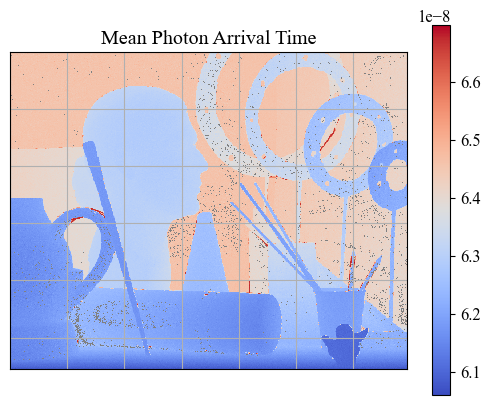

In [32]:
image = np.nanmean(ts, axis=-1)
masked_array = np.ma.array(image, mask=np.isnan(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)
plt.imshow(image, interpolation='nearest', cmap=cmap)
plt.grid()
plt.tick_params(axis='both', 
                left=False, 
                top=False, 
                right=False, 
                bottom=False, 
                labelleft=False, 
                labeltop=False, 
                labelright=False, 
                labelbottom=False)
# plt.savefig("bowl_sppp2_sbr0010/")
plt.colorbar()
plt.title("Mean Photon Arrival Time")
plt.savefig(f"graph_max/{tspath}_mean.png", bbox_inches="tight")
plt.show()

In [33]:
def shorten_ts(ts_m, k_m):
    row_num = len(ts_m)
    col_num = len(ts_m[0])
    max_k = k_m.max()
    ts_short = np.empty((row_num, col_num, int(max_k)))
    for i in range(row_num):
        for j in range(col_num):
            valid_v = ts_m[i, j][~np.isnan(ts_m[i, j])]
            ts_short[i, j] = np.pad(valid_v, (0, int(max_k - k_m[i, j])), "constant", constant_values=np.nan)
    
    return ts_short

## 1. Scaled Photon Count

In [34]:
def find_k_matrix(ts_m):
    k_matrix = np.empty((len(ts_m), len(ts_m[0])))
    for i in range(len(ts_m)):
        for j in range(len(ts_m[0])):
            k_matrix[i, j] = np.count_nonzero(~np.isnan(ts_m[i, j])) # reject the NaNs recorded
    return k_matrix

In [36]:
def NPC(k_m, sppp):
    N = sppp*500
    # normalized photon count
    return k_m/(N*eta*S)

In [35]:
k_m = find_k_matrix(ts)

In [37]:
ts = shorten_ts(ts, k_m)

In [38]:
ts.shape

(555, 695, 34)

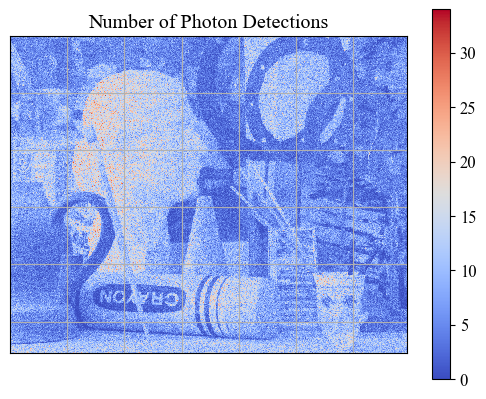

In [39]:
image = k_m
masked_array = np.ma.array(image, mask=np.isnan(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)
plt.imshow(image, interpolation='nearest', cmap=cmap)
plt.grid()
plt.colorbar()
plt.tick_params(axis='both', 
                left=False, 
                top=False, 
                right=False, 
                bottom=False, 
                labelleft=False, 
                labeltop=False, 
                labelright=False, 
                labelbottom=False)
plt.title("Number of Photon Detections")
plt.savefig(f"graph_max/{tspath}_num.png", bbox_inches="tight")
plt.show()

In [117]:
npc_result = NPC(k_m, sppp)

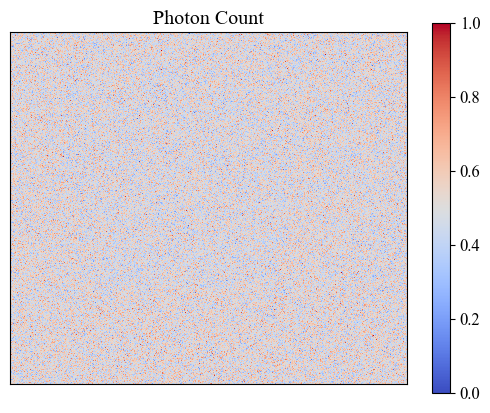

In [150]:
image = cap_scale(npc_result, high_cap=npc_result.max(), low_cap=npc_result.min())
masked_array = np.ma.array(image, mask=np.isnan(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)
plt.imshow(image, interpolation='nearest', cmap=cmap)
plt.colorbar()
plt.tick_params(axis='both', 
                left=False, 
                top=False, 
                right=False, 
                bottom=False, 
                labelleft=False, 
                labeltop=False, 
                labelright=False, 
                labelbottom=False)
plt.title("Photon Count")
plt.savefig(f"graph_max/{tspath}_NPC.png", bbox_inches="tight")
plt.show()

## 2. PML For Reflectivity

In [30]:
def pen_TV(alpha, gamma):
    term1 = np.pad(np.square(np.diff(alpha)), ((0, 0), (0, 1)), "constant", constant_values=0)
    term2 = np.pad(np.square(np.diff(alpha.T).T), ((0, 1), (0, 0)), "constant", constant_values=0)
    return np.sum(np.sqrt(term1 + term2)) + gamma

In [31]:
def loss_alpha_PML(alpha, k_matrix, B, beta, gamma, row_num, col_num, N):
    alpha = alpha.reshape(row_num, col_num)
    term1 = (N-k_matrix)*eta*S*alpha
    term2 = -k_matrix*np.log(1 - np.exp(-(eta*alpha*S + B)))
    
    pen = pen_TV(alpha, gamma)
    return beta*pen+np.sum(term1+term2) #L + beta*pen


In [32]:
def compute_jac(alpha, *argv):
    # args=(k_matrix, B, beta, gamma, row_num, col_num, N)
    k_m = argv[0]    
    row_num = argv[-3]
    col_num = argv[-2]
    N = argv[-1]
    
    B = argv[1]
    beta = argv[2]

    alpha = alpha.reshape((row_num, col_num))

    # compute grad(neg_log_likelihood)
    P0 = np.exp(-(eta*alpha*S+B))
    grad_logl = eta*S*((N-k_m) - k_m*(P0/(1-P0)))


    # compute grad(pen(alpha))

    ij = np.pad(alpha, ((1, 1), (1, 1)), "edge")

    i_add_1 = np.roll(ij, -1, axis=0)
    i_min_1 = np.roll(ij, 1, axis=0)
    j_add_1 = np.roll(ij, -1, axis=1)
    j_min_1 = np.roll(ij, 1, axis=1)
    i_min_1_j_add_1 = np.roll(ij, (1, -1), axis=(0, 1))
    i_add_1_j_min_1 = np.roll(ij, (-1, 1), axis=(0, 1))

    term1 = np.square(i_add_1 - ij) + np.square(j_add_1 - ij)
    term1 = np.where(term1>1E-9, term1, 1E-9)

    term2 = np.square(ij - i_min_1) + np.square(i_min_1_j_add_1-i_min_1)
    term2 = np.where(term2>1E-9, term2, 1E-9)

    term3 = np.square(ij - j_min_1) + np.square(i_add_1_j_min_1 - j_min_1)
    term3 = np.where(term3>1E-9, term3, 1E-9)

    grad_TV = np.power(term1, -0.5)*(2*ij - i_add_1 - j_add_1) 
    + np.power(term2, -0.5)*(ij - i_min_1) 
    + np.power(term3, -0.5)*(ij - j_min_1)

    return (grad_logl+beta*grad_TV[1:-1,1:-1]).flatten()

In [33]:
def show_calculateMSE(result, 
                      loss_funct_value, 
                      gradient_norm, 
                      row_num, 
                      col_num, 
                      true_image="Art",
                      beta=500, 
                      ftol=1E-4, 
                      SBR=1.0,
                      sppp=2.0):
    # to show the results and the ground truth side by side
    # and calculate the MSE

    image = cap_scale(result.x, high_cap=1.0, low_cap=0.0, offset=0.0).reshape(row_num, col_num)

    fig, ax = plt.subplots(2, 2, dpi=200)
    fig.subplots_adjust(right=1, left=0, hspace=0.4)
    
    if true_image == "Art":
        true_alpha = art_alpha
    else:
        true_alpha = bowl_alpha
    
    fig.suptitle(f"SBR = {SBR}, SPPP = {sppp}, Converged = {result.success}, beta={beta:3.0f}, ftol={ftol}, #iter = {result.nit}, MSE = {reflectivity_MSE_db(image, true_alpha):.3f} dB")
    
    im = ax[0, 0].imshow(image, cmap=plt.get_cmap('gray'), vmin=0.0, vmax=1.0)
    ax[0, 0].grid()
    ax[0, 0].set_title("Estimated reflectivity")
    
    im = ax[0, 1].imshow(true_alpha, cmap=plt.get_cmap('gray'), vmin=0.0, vmax=1.0)
    ax[0, 1].grid()
    ax[0, 1].set_title("True reflectivity")

    cbar_ax = fig.add_axes([0.42, 0.55, 0.02, 0.35])
    fig.colorbar(im, cax=cbar_ax)

    ax[1, 0].plot(loss_funct_value)
    ax[1, 0].set_title("Objective")
    ax[1, 0].grid()

    ax[1, 1].plot(gradient_norm)
    ax[1, 1].set_title("Penalty Term")
    ax[1, 1].grid()

    fig.patch.set_facecolor('white')
    plt.savefig(f'graph_max/{tspath}_rPML_beta{beta:3.0f}.png', bbox_inches='tight')
    plt.show()

In [34]:
def trial(k_m, 
          initial_guess, 
          true_image="Art", 
          SBR=1.0, 
          sppp=2, 
          gamma=1, 
          beta=500, 
          method='L-BFGS-B', 
          ftol=1E-4):
    def log_loss_value(intermediate_result):
        # for logging the value of the loss function at each step
        nonlocal loss_funct_value
        nonlocal gradient_norm
        loss_funct_value.append(intermediate_result.fun)
        gradient_norm.append(pen_TV(intermediate_result.x.reshape((row_num, col_num)), gamma))
    
    row_num = len(k_m)
    col_num = len(k_m[0])
    
    loss_funct_value = [] # to store loss function values
    gradient_norm = []

    if true_image == "Art":
        B = find_B(art_alpha_avg, SBR)
    else:
        B = find_B(bowl_alpha_avg, SBR)

    result = minimize(loss_alpha_PML,
                    initial_guess.flatten(), 
                    args=(k_m, B, beta, gamma, row_num, col_num, 500*sppp), 
                    method=method, 
                    tol=ftol, # set tolerance value for determining what counts as convergence
                    bounds=[(0, None)]*row_num*col_num, # specify the bounds of the estimated reflectivity to be inside [0, 1]
                    jac=compute_jac, # specify function for calculating the gradient
                    callback=log_loss_value, # to log the loss function values at each step
                    options={'eps':1E-4, 'maxiter':1E5}) 
    
    show_calculateMSE(result, 
                      loss_funct_value, 
                      gradient_norm, 
                      row_num, 
                      col_num, 
                      true_image, 
                      beta=beta, 
                      ftol=ftol, 
                      SBR=SBR, 
                      sppp=sppp)
    return result

In [147]:
bowl_alpha_guess = np.empty_like(bowl_alpha)
bowl_alpha_guess.fill(bowl_alpha_avg)

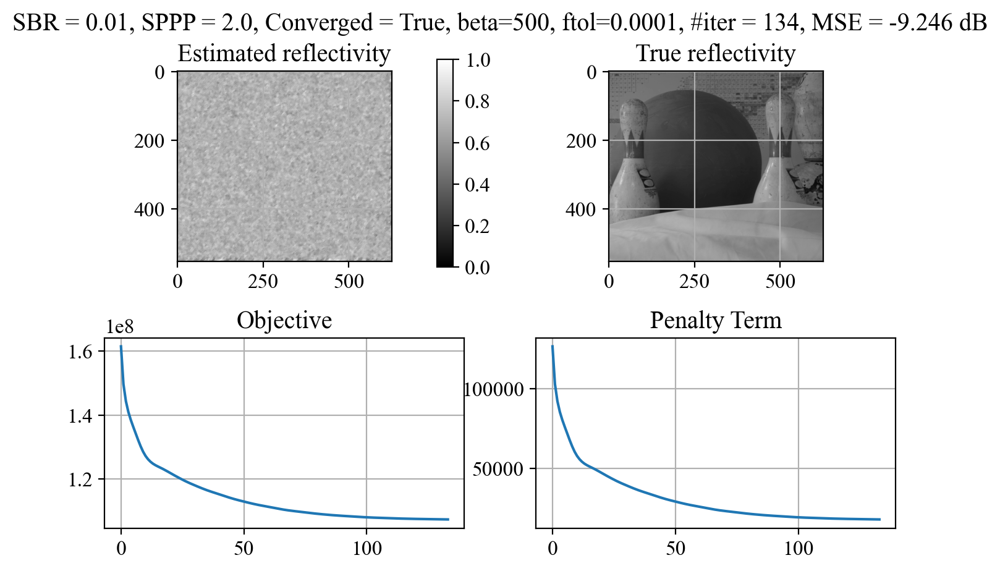

In [149]:
alpha_pml_result = trial(k_m, np.random.random(bowl_alpha.shape), 
          true_image=scene, 
          SBR=sbr, 
          sppp=sppp, 
          gamma=1, 
          beta=500, 
          method='L-BFGS-B', 
          ftol=1E-4)

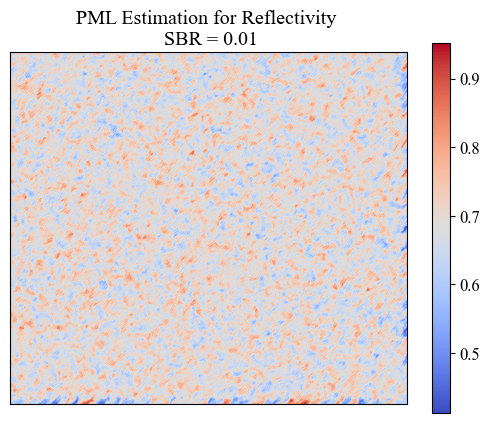

In [170]:
if scene == "Art":
    alpha_pml_image = alpha_pml_result.x.reshape(art_alpha.shape)
else:
    alpha_pml_image = alpha_pml_result.x.reshape(bowl_alpha.shape)
alpha_pml_image = cap_scale(alpha_pml_image)
plt.imshow(alpha_pml_image, cmap=plt.get_cmap("coolwarm"))
plt.title(f"PML Estimation for Reflectivity \n SBR = {sbr}")
plt.colorbar()
plt.tick_params(axis='both', 
                left=False, 
                top=False, 
                right=False, 
                bottom=False, 
                labelleft=False, 
                labeltop=False, 
                labelright=False, 
                labelbottom=False)
plt.savefig(f"graph_max/{tspath}_rPML.png", bbox_inches="tight")
plt.show()

# Step 2: Rejection of background detections




In [35]:
def compute_median(ts):
    start_time = time.time() # start timing

    ts_padded = np.pad(ts, [(1, 1), (1, 1), (0, 0)], mode='constant', constant_values=np.nan)
    row_num = len(ts_padded)
    col_num = len(ts_padded[0])
    ts_median = np.empty((row_num - 2, col_num - 2))
    ts_median.fill(np.inf)
    for i in range(1, row_num - 1):
        for j in range(1, col_num - 1):
            neighbor = np.concatenate((ts_padded[i-1][j-1:j+2], 
                                        ts_padded[i][j-1:j], 
                                        ts_padded[i][j+1:j+2], 
                                        ts_padded[i+1][j-1:j+2]))
            median = np.nanmedian(neighbor)
            if median == None:
                median = np.inf
            ts_median[i - 1, j - 1] = median
    T = time.time() - start_time # calculate the time required for convergence
    print("computing median took = ", T)
    return ts_median
    

In [161]:
ts_median = compute_median(ts)

computing median took =  29.498178958892822


|Scene | SPPP    | SBR | Computing median (s) |
| --| -------- |  ------- | ------- |
|Art | 2  | 0.01    | 29.498 |
| Art| 2    | 1.0    |  |

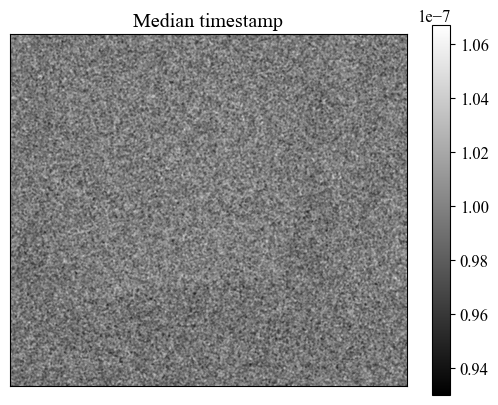

In [180]:
plt.imshow(ts_median, cmap=plt.get_cmap('gray'))
plt.title("Median timestamp")
plt.colorbar()
plt.tick_params(axis='both', 
                left=False, 
                top=False, 
                right=False, 
                bottom=False, 
                labelleft=False, 
                labeltop=False, 
                labelright=False, 
                labelbottom=False)
plt.savefig(f"graph_max/{tspath}_median_mean.png", bbox_inches="tight")
plt.show()

Only choose the detections for pixel at ${i, j}$ that fulfill this requirement: 

$$
|t_{i, j}^{(l)} - t_{i, j}^\text{ROM}| < 2 T_p \left( \frac{B}{\eta\hat{\alpha}_{i, j}^\text{PML}S + B} \right)
$$

where $l \in {1, \dots, k_{i, j}}$. If $k_{i, j} = 0$, that means there are no observations to begin with, so there are no detections also.

In [36]:
def reject_ts(ts_m, ts_ROM, alpha_PML, B):
    start_time = time.time() # start timing
    N = len(ts_m[0][0])
    

    return_ts_cen = np.empty_like(ts_m)
    # return_ts_cen.fill(np.nan)

    for k in range(N):
        diff = np.abs(ts_m[:,:,k] - ts_ROM) # |t - tROM|
        criterion = 2*(T_p*2)*(B/(eta*alpha_PML*S+B)) # see note below for T_p*2
        return_ts_cen[:,:,k] = np.where(diff < criterion, ts_m[:,:,k], np.nan)
    T = time.time() - start_time # calculate the time required for convergence
    print("censoring used = ", T)
    return return_ts_cen


Note that since in the beginning, we divided the prescribed $T_p$ by $2$ since we can directly use that value for $\sigma$ for pulse generation, here, the original $T_p$ has to be restored by multiplying it by $2$.

In [172]:
test_ts_cen = reject_ts(ts, ts_median, alpha_pml_image, B)

censoring used =  7.130435943603516


In [41]:
test_ts_cen = np.genfromtxt("csv/bowl_sbr1000_sppp0600_cen_mode.csv", delimiter=",")

In [45]:
test_ts_cen = test_ts_cen.reshape((555, 626, 6))

In [43]:
2084580/555/626

6.0

/tmp/ipykernel_176175/813614873.py:1: RuntimeWarning: Mean of empty slice
  mean_ts_cen = np.nanmean(test_ts_cen, axis=-1)


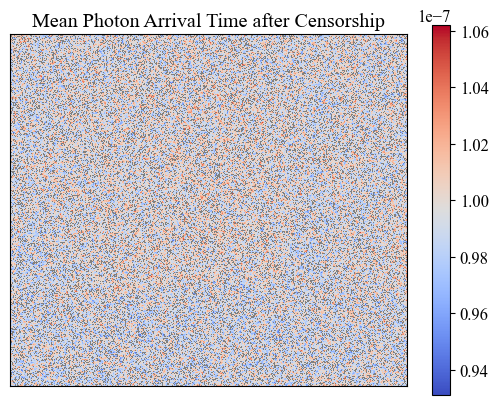

In [182]:
mean_ts_cen = np.nanmean(test_ts_cen, axis=-1)
masked_array = np.ma.array(mean_ts_cen, mask=np.isnan(mean_ts_cen))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)
plt.imshow(masked_array, interpolation='nearest', cmap=cmap)
# plt.grid()
plt.title("Mean Photon Arrival Time after Censorship")
plt.colorbar()
plt.tick_params(axis='both', 
                left=False, 
                top=False, 
                right=False, 
                bottom=False, 
                labelleft=False, 
                labeltop=False, 
                labelright=False, 
                labelbottom=False)
plt.savefig(f"graph_max/{tspath}_median_cen_mean.png", bbox_inches="tight")
plt.show()

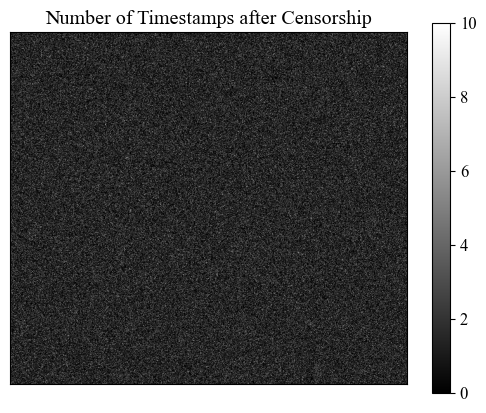

In [184]:
plt.imshow(np.count_nonzero(~np.isnan(test_ts_cen), axis=-1), cmap=plt.get_cmap('gray'))
plt.title("Number of Timestamps after Censorship")
plt.colorbar()
plt.tick_params(axis='both', 
                left=False, 
                top=False, 
                right=False, 
                bottom=False, 
                labelleft=False, 
                labeltop=False, 
                labelright=False, 
                labelbottom=False)
plt.savefig(f"graph_max/{tspath}_median_cen_num.png", bbox_inches="tight")
plt.show()

In [176]:
if scene == "Art":
    test_z = art_z
else:
    test_z = bowl_z

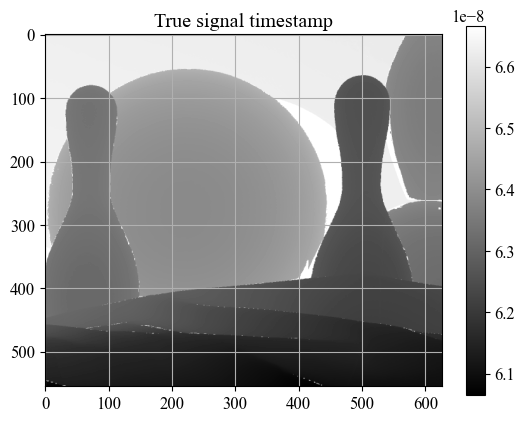

In [177]:
true_sig_ts = T_r/2 + 2*test_z/c
plt.imshow(true_sig_ts, cmap=plt.get_cmap('gray'))
plt.grid()
plt.title("True signal timestamp")
plt.colorbar()
plt.show()

Let us view the difference between the censored timestamps and the true signal timestamps:

/tmp/ipykernel_176175/996888009.py:1: RuntimeWarning: Mean of empty slice
  arr_show = np.nanmean(test_ts_cen, axis=-1) - true_sig_ts


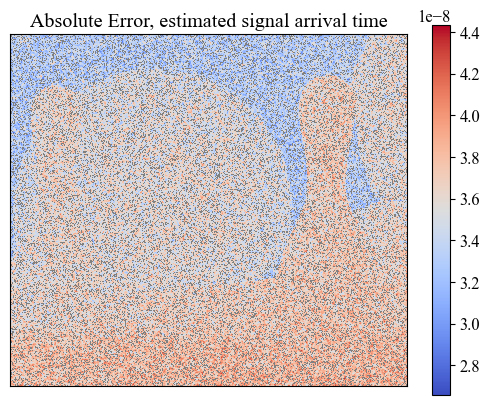

In [186]:
arr_show = np.nanmean(test_ts_cen, axis=-1) - true_sig_ts
masked_array = np.ma.array(arr_show, mask=np.isnan(arr_show))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)
plt.imshow(masked_array, interpolation='nearest', cmap=cmap)
# plt.grid()
plt.title("Absolute Error, estimated signal arrival time")
plt.colorbar()
plt.tick_params(axis='both', 
                left=False, 
                top=False, 
                right=False, 
                bottom=False, 
                labelleft=False, 
                labeltop=False, 
                labelright=False, 
                labelbottom=False)
plt.savefig(f"graph_max/{tspath}_abserr_median_cen_mean.png", bbox_inches="tight")
plt.show()

# Depth Estimation



In [40]:
def pen_TV_z(z, gamma_z): # same thing as total variation penalty for reflectivity
    term1 = np.pad(np.square(np.diff(z)), ((0, 0), (0, 1)), "constant", constant_values=0)
    term2 = np.pad(np.square(np.diff(z.T).T), ((0, 1), (0, 0)), "constant", constant_values=0)
    return np.sum(np.sqrt(term1 + term2)) + gamma_z

In [41]:
def loss_z_PML(z_m, ts_m, beta_z, gamma_z):
    row_num = len(ts_m)
    col_num = len(ts_m[0])
    N = len(ts_m[0, 0]) # number of pulses sent

    z_m = z_m.reshape((row_num, col_num))
    tot_neg = 0

    for k in range(N):
        tot_neg += np.nansum(np.square(ts_m[:,:,k] - (2/c)*z_m - T_r/2))
    tot_neg /= 2*(T_p)**2

    pen_z = pen_TV_z(z_m, gamma_z)
    value = beta_z*pen_z+tot_neg
    # print(value)

    return value  
    

In [42]:
def compute_jac_z(z, *argv):
    # args=(ts_m, beta_z, gamma_z)
    ts_m = argv[0]
    row_num = len(ts_m)
    col_num = len(ts_m[0])
    N = len(ts_m[0, 0]) # number of pulses sent
    
    beta_z = argv[1]

    z = z.reshape((row_num, col_num))

    # compute grad(neg_log_likelihood)
    
    grad_logl = np.zeros_like(z)

    for k in range(N):
        add_term = ts_m[:,:,k] - (2/c)*z - T_r/2
        grad_logl += np.where(np.isnan(add_term), 0, add_term)
    grad_logl *= -2/(c*(T_p**2))

    # compute grad(pen(z))

    ij = np.pad(z, ((1, 1), (1, 1)), "edge")

    i_add_1 = np.roll(ij, -1, axis=0)
    i_min_1 = np.roll(ij, 1, axis=0)
    j_add_1 = np.roll(ij, -1, axis=1)
    j_min_1 = np.roll(ij, 1, axis=1)
    i_min_1_j_add_1 = np.roll(ij, (1, -1), axis=(0, 1))
    i_add_1_j_min_1 = np.roll(ij, (-1, 1), axis=(0, 1))

    term1 = np.square(i_add_1 - ij) + np.square(j_add_1 - ij)
    term1 = np.where(term1>1E-9, term1, 1E-9)

    term2 = np.square(ij - i_min_1) + np.square(i_min_1_j_add_1-i_min_1)
    term2 = np.where(term2>1E-9, term2, 1E-9)

    term3 = np.square(ij - j_min_1) + np.square(i_add_1_j_min_1 - j_min_1)
    term3 = np.where(term3>1E-9, term3, 1E-9)

    grad_TV = np.power(term1, -0.5)*(2*ij - i_add_1 - j_add_1) 
    + np.power(term2, -0.5)*(ij - i_min_1) 
    + np.power(term3, -0.5)*(ij - j_min_1)

    return (grad_logl+beta_z*grad_TV[1:-1,1:-1]).flatten()

In [43]:
def show_calculateRMSE(result, 
                       loss_funct_value, 
                       gradient_norm, 
                       row_num,
                       col_num,
                       SBR=1, 
                       sppp=2, 
                       beta_z=10000,
                       high_cap=14.5,
                       low_cap=0.5,
                       offset=0.5,
                       range=14.0):

    image = cap_scale(result.x, 
                      high_cap=high_cap, 
                      low_cap=low_cap, 
                      offset=offset, 
                      range=range).reshape(row_num, col_num)

    fig, ax = plt.subplots(2, 2, dpi=200)
    fig.subplots_adjust(right=1, left=0, hspace=0.4)
    if scene == "art":
        test_z = art_z
    else:
        test_z = bowl_z
    # depth_RMSE(estimate, truth):
    fig.suptitle(f"Sppp = {sppp}, SBR = {SBR}, Converged = {result.success}, beta = {beta_z:1.0f}, RMSE = {depth_RMSE(image, test_z):.3f} m")
    
    im = ax[0, 0].imshow(image, cmap=plt.get_cmap('gray'), vmin=low_cap, vmax=high_cap)
    ax[0, 0].grid()
    ax[0, 0].set_title("Estimated depth")
    
    im = ax[0, 1].imshow(test_z, cmap=plt.get_cmap('gray'), vmin=low_cap, vmax=high_cap)
    ax[0, 1].grid()
    ax[0, 1].set_title("True depth")

    cbar_ax = fig.add_axes([0.42, 0.55, 0.02, 0.35])
    fig.colorbar(im, cax=cbar_ax)

    ax[1, 0].plot(loss_funct_value)
    ax[1, 0].set_title("Objective")
    ax[1, 0].set_yscale('log')
    ax[1, 0].grid()

    ax[1, 1].plot(gradient_norm)
    ax[1, 1].set_title("Penalty Term")
    ax[1, 1].grid()

    fig.patch.set_facecolor('white')
    plt.savefig(f'graph_max/{tspath}_dPML_beta{beta_z:1.0f}.png', bbox_inches='tight')
    plt.show()
    
    

In [44]:
def trial_z(ts, ig, SBR=1.0, sppp=2, gamma_z=1, beta_z=10000, method='L-BFGS-B', ftol=1E-3):
    
    def log_loss_value(intermediate_result):
        nonlocal loss_funct_value
        nonlocal gradient_norm
        loss_funct_value.append(intermediate_result.fun)
        gradient_norm.append(pen_TV_z(intermediate_result.x.reshape((row_num, col_num)), gamma_z))

    row_num = len(ts)
    col_num = len(ts[0])

    start_time = time.time()
    loss_funct_value = []
    gradient_norm = []

    result = minimize(loss_z_PML,
                    ig.flatten(), 
                    args=(ts, beta_z, gamma_z), 
                    method=method, 
                    tol=ftol,
                    # bounds=[(4, 5)]*row_num*col_num,
                    jac=compute_jac_z,
                    callback=log_loss_value, 
                    options={'eps':1E-5, 'maxiter':1E5})
    T = time.time() - start_time

    show_calculateRMSE(result, 
                       loss_funct_value, 
                       gradient_norm, 
                       row_num,
                       col_num,
                       SBR=SBR, 
                       sppp=sppp, 
                       beta_z=beta_z,
                       high_cap=2.5, low_cap=1.5, offset=1.5, range=1.0)
    return result

In [45]:
from scipy import ndimage

In [46]:
def calculate_initial_guess(ts_median):
    median_dist = (ts_median - T_r/2)*c/2
    
    return ndimage.uniform_filter(np.where(np.isnan(median_dist), np.random.random() + 1.5, median_dist), size=15, mode="reflect") + (np.random.random(median_dist.shape) - 0.5)*0.1


In [47]:
oracle_ig = calculate_initial_guess(np.nanmean(ts, axis=-1))

/tmp/ipykernel_174399/2524732428.py:1: RuntimeWarning: Mean of empty slice
  oracle_ig = calculate_initial_guess(np.nanmean(ts, axis=-1))


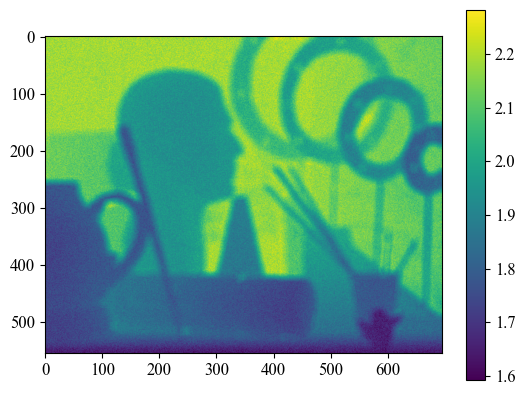

In [48]:
plt.imshow(oracle_ig)
plt.colorbar()
plt.show()

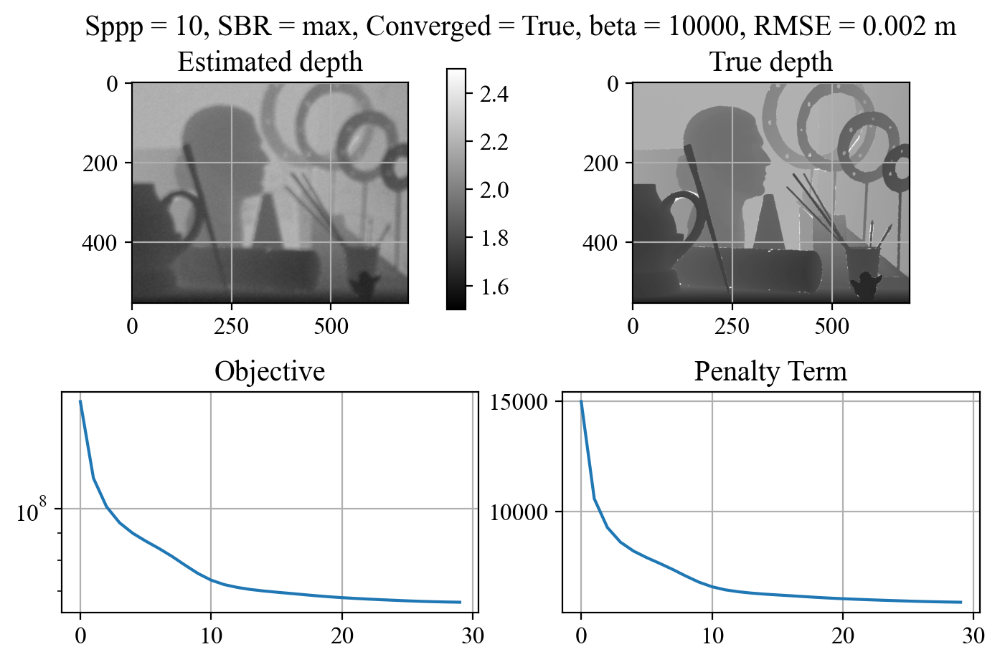

In [49]:
z_PML = trial_z(ts, oracle_ig, SBR="max", sppp=sppp, beta_z=10000)

In [50]:
np.savetxt(f"graph_max/{tspath}_dPML.csv", z_PML.x, delimiter=",")

# Conclusion
This shows that the ROM filter is a good one for a wide range of $z_{i, j}$, as long as the criterion in my claim is fulfilled. For low reflectivity values, the criterion is violated, and the ROM filter tends to overestimate the signal timestamp.

We can inspect how does ROM overestimate for one of these red pixels in the above image.
Let us pick one pixel, $(250, 10)$.

In [58]:
print("True reflectivity of (250, 10) is ", test_alpha[250, 10])
print("True depth of (250, 10) is ", test_z[250, 10])

True reflectivity of (250, 10) is  0.021645021645021644
True depth of (250, 10) is  4.677506775067751


In [59]:
print("Actual arrival of signal timestamp is ", T_r/2 + 2*test_z[250, 10]/c)

Actual arrival of signal timestamp is  8.118337850045167e-08


In [60]:
i = 250
j = 10

neighbor = np.concatenate((test_ts[i-1][j-1:j+2], 
                            test_ts[i][j-1:j], 
                            test_ts[i][j+1:j+2], 
                            test_ts[i+1][j-1:j+2]))
median = np.nanmedian(neighbor)

In [63]:
criterion = 2*(T_p*2)*(B_test/(eta*test_alpha[250, 10]*S+B_test))

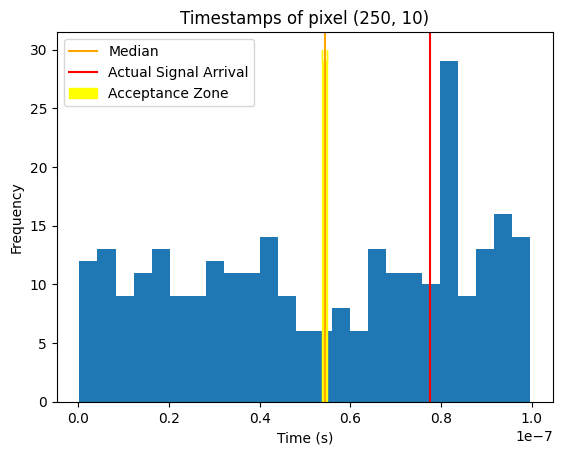

In [64]:
n, _, _ = plt.hist(neighbor.flatten(), bins=25)
plt.axvline(median, label="Median", c="orange")
plt.axvline(7.757E-8, label="Actual Signal Arrival", c="red")
plt.fill_betweenx([0, 10, 20, 30, np.max(n)], median-criterion, median+criterion, interpolate=True, label="Acceptance Zone", color="yellow")
plt.legend()
plt.title("Timestamps of pixel (250, 10)")
plt.xlabel("Time (s)")
plt.ylabel("Frequency")
plt.show()

# How "far" is far?



We now know that the true depth value $z_{i, j}$ cannot be too far from $cT_r/4$, since doing so will cause $\frac{|4z_{i, j}/c - T_r|}{2T_r}$ to be too large, thus the reflectivity value has to be large for the ROM filter to work.

To characterize this "largeness", we have to realize that whether this distance is large is dependent on the reflectivity we are trying to estimate. If the reflectivity $\alpha_{i, j} = 1.0$, the range allowed for $z_{i, j}$ is huge compared to say, $\alpha_{i, j} = 0.1$.

We can check the following: When will only half the range of reflectivity give accurate results? Specifically, when will only $\alpha_{i, j} \in [0.5, 1.0]$ give accurate results under ROM filtering?

First, we can attempt this problem by looking at the math. All that we are asking for is for 
$$
\alpha_{i, j} \geq \frac{|4z_{i, j}/c - T_r|}{2T_r}
$$

We want only half the range of reflectivity fulfill this requirement. This means that the equality is attained when $\alpha_{i, j} = 0.5$. Plugging this in, we have

$$
0.5 = \frac{|4z_{i, j}/c - T_r|}{2T_r}
$$
$$
T_r = |4z_{i, j}/c - T_r|
$$

$$
-(4z_{i, j}/c - T_r) = T_r \hspace{2cm} \text{or} \hspace{2cm}  4z_{i, j}/c - T_r = T_r
$$

$$
 4z_{i, j}/c = 0 \hspace{2cm} \text{or} \hspace{2cm} 4z_{i, j}/c = 2T_r
$$

$$
z_{i, j} = \frac{cT_r}{2}
$$

We are not discussing the case where $z_{i, j} = 0$, since we have set the assumption that $z_{i, j} \in (0, z_{\max}]$ and this would mean the photon spend $0$ time in the air and we get the signal back immediately. There is also no way to design an accurate system that includes $0$ without aliasing. So, rather unsurprisingly, we get $z_{i, j} = \frac{cT_r}{2}$. In our case, this means $z_{i, j} = 15$ m. At this distance, half of the reflectivity range will not be able to give accurate results under ROM filtering.

Here we remember that in the experimental setup section in the paper, $T_r$ is set such that $T_r > 2z_{\max}/c$ to avoid aliasing. This means that this distance is never considered to begin with. 

As a replacement, we can consider when will the range get cut by $1/5$, i.e. it works for range $\alpha_{i, j} \in [0.2, 1.0]$ but not $[0.0, 0.2)$. Following the previous steps we obtain $z_{0.2} = 4.5$ or $10.5$ m. Since only $4.5$ m is in experimental data we choose this one.

We can verify this from the results we have obtained:

In [65]:
abs_err = test_z_PML.x.reshape((370, 463)) - test_z

In [66]:
print("True depth value = ", test_z[184][0])

True depth value =  4.4986449864498645


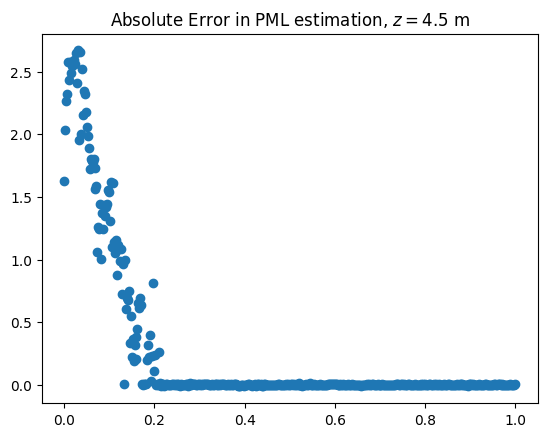

In [67]:
plt.scatter(test_alpha[184], abs_err[184])
plt.title(r'Absolute Error in PML estimation, $z = 4.5$ m')
plt.show()

We quite literally start seeing non-zero absolute errors start emerging for pixels with reflectivity values below $0.2$.

# Improvement Schemes

Here, we try out different methods to improve upon this ROM filter.

1. Change T_r such that the 4*z/c cluster around T_r
2. Instead of a straight median, maybe calculate the dot product between the timestamp distribution with a function that gives more weight to timestamps inside the zone of interest?? That function will be only dependent on T_r, which could be pre-calculated, and also convenient for discretization depending on the user's requirement for accuracy
3. Repeat the experiment K times to improve SBR



## 1. Change $T_r$ such that the $4z/c$ cluster around $T_r$
Method 1 will essentially change the specifications of hardware. This is not very realistic, and since it is a direct result of the threshold proposed, it is not very meaningful to discuss here. A simple simulation of this method is presented as follows:

## 2. Windowing into the zone of interest

The fundamental issue causing the ROM filter to fail is essentially


Also, fundamentally, the values $B$ and $T_r$ are pre-determined: one can calibrate for $B$ and $T_r$ is a value of specification. Therefore, we can simply remove the density of photon timestamps due to background throughout the period of $[0, T_r]$ by deducting this value at all times. Essentially, we modify our back-reflected photon count rate function $\lambda'(t) = $



How do we account for this background in our detected photon timestamps? Histogramming is a not a choice here, since we want to do this fast enough while 

In [310]:
def window(neighbor):
    bins = 185
    timebins = np.linspace(0, T_r, 186)
    curr_max = 0
    candidates = []
    for i in range(bins):
        in_set = neighbor[np.logical_and(neighbor >= timebins[i], neighbor < timebins[i+1])]
        if len(in_set) > curr_max:
            curr_max = len(in_set)
            candidates = [in_set]
        elif len(in_set) == curr_max:
            candidates.append(in_set)

    rand_idx = np.random.randint(len(candidates))
    return candidates[rand_idx]

In [313]:
def reject_ts_windowed(ts_m):
    row_num = len(ts_m)
    col_num = len(ts_m[0])

    return_ts_cen = np.empty_like(ts_m)
    return_ts_cen.fill(np.nan)
    ts_padded = np.pad(ts_m, [(1, 1), (1, 1), (0, 0)], mode='constant', constant_values=np.nan)
    for i in range(row_num):
        for j in range(col_num):
            neighbor = np.concatenate((ts_padded[i-1][j-1:j+2], 
                                    ts_padded[i][j-1:j], 
                                    ts_padded[i][j+1:j+2], 
                                    ts_padded[i+1][j-1:j+2]))
            windowed_ts = window(neighbor)
            if len(windowed_ts) == 0:
                continue
            if len(windowed_ts.flatten()) > 200:
                return_ts_cen[i, j] = windowed_ts.flatten()[:200]
            else:
                return_ts_cen[i, j, :len(windowed_ts)] = windowed_ts.flatten()
    return return_ts_cen

In [314]:
window_ts = reject_ts_windowed(test_ts)

/tmp/ipykernel_107978/69317779.py:1: RuntimeWarning: Mean of empty slice
  image = np.nanmean(window_ts, axis=-1)


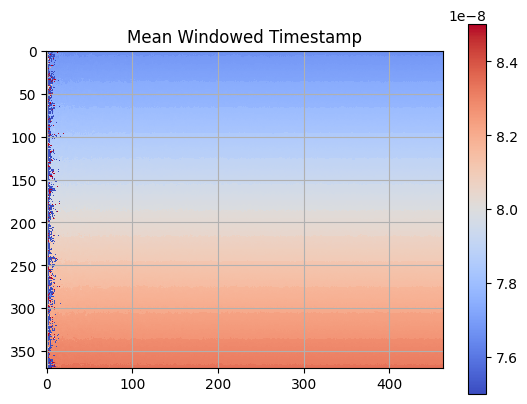

In [315]:
image = np.nanmean(window_ts, axis=-1)
masked_array = np.ma.array(image, mask=np.isinf(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)
plt.imshow(masked_array, interpolation='nearest', cmap=cmap, vmax=8.5E-8, vmin=7.5E-8)
plt.grid()
plt.title("Mean Windowed Timestamp")
plt.colorbar()
plt.show()

In [316]:
test_z_PML_windowed = trial_z(0, 370, 0, 463, window_ts, beta_z=10000)

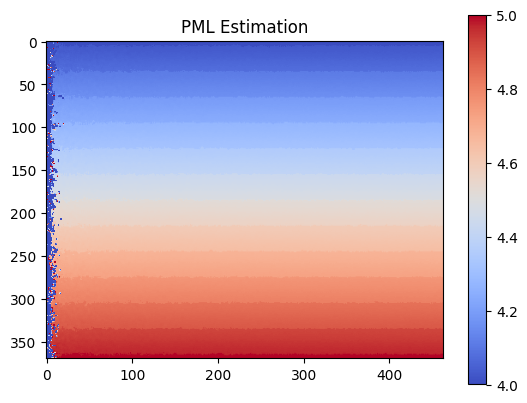

In [320]:
plt.imshow(test_z_PML_windowed.x.reshape((370, 463)), cmap=plt.get_cmap("coolwarm"), vmin=4.0, vmax=5.0)
plt.title("PML Estimation")
plt.colorbar()
plt.show()

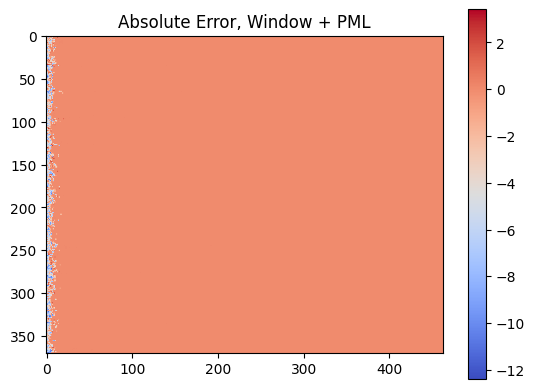

In [360]:
plt.imshow(test_z_PML_windowed.x.reshape((370, 463)) - test_z, cmap=plt.get_cmap("coolwarm"))
plt.title("Absolute Error, Window + PML")
plt.colorbar()
# plt.savefig("abs_err_window_SBR1.png")
plt.show()

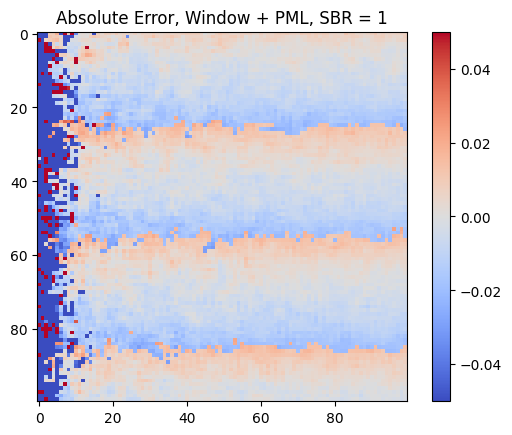

In [346]:
plt.imshow((test_z_PML_windowed.x.reshape((370, 463)) - test_z)[250:350, 0:100], cmap=plt.get_cmap("coolwarm"), vmin=-0.05, vmax=0.05)
plt.title("Absolute Error, Window + PML, SBR = 1")
plt.colorbar()
# plt.savefig("abs_err_window_SBR1.png")
plt.show()

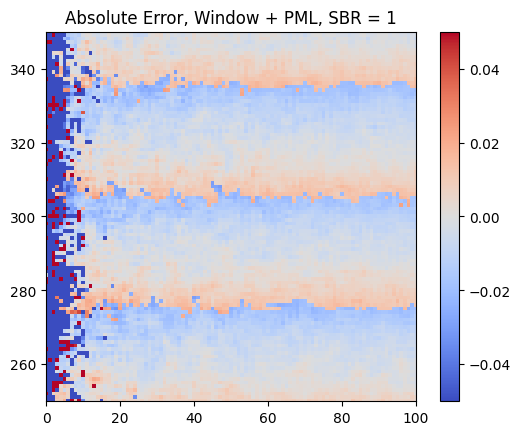

In [351]:
plt.imshow((test_z_PML_windowed.x.reshape((370, 463)) - test_z), cmap=plt.get_cmap("coolwarm"), vmin=-0.05, vmax=0.05)
plt.title("Absolute Error, Window + PML, SBR = 1")
plt.colorbar()
plt.ylim([250,350])
plt.xlim([0, 100])
plt.savefig("abs_err_window_SBR1_250350_000100.png")
plt.show()

In [ ]:
frames = iio.imread("baselines/depth_video/test_depth/test_00012_depth.mp4", plugin="pyav")
gray_frames = np.dot(frames, [0.2989, 0.5870, 0.1140])
gray_frames = np.round(gray_frames).astype(np.uint8)
gray_frames.shape
depth = -gray_frames + 255

In [338]:
np.arange(0, 120, 20)

array([  0,  20,  40,  60,  80, 100])

In [324]:
depth_RMSE(test_z_PML_windowed.x.reshape((370, 463)), test_z)

0.5719512509588023

4 minutes 8.5 seconds
RMSE = 57.2 cm

## 3. Randomly reject $8B$ values from the neighborhood

In [137]:
neighbor_valid = neighbor.flatten()[~np.isnan(neighbor.flatten())]

In [263]:
bin_size = T_r/184

In [266]:
(B_test/186)*8*200

1.5053763440860206

In [262]:
np.linspace(0, T_r, 185)[1] - np.linspace(0, T_r, 185)[0]

5.434782608695652e-10

In [269]:
len(np.linspace(0, T_r, 186))

186

In [273]:
timebins = np.linspace(0, T_r, 186)
remaining_arr = np.array([])
for i in range(185):
    in_set = neighbor_valid[np.logical_and(neighbor_valid >= timebins[i], neighbor_valid < timebins[i+1])]
    remaining = np.random.choice(in_set, max(len(in_set) - 2, 0), replace=False)
    remaining_arr = np.append(remaining_arr, remaining)

In [277]:
np.count_nonzero(remaining_arr)

58

In [294]:
def compute_median_reject(ts):
    ts_padded = np.pad(ts, [(1, 1), (1, 1), (0, 0)], mode='constant', constant_values=np.nan)
    ts_padded = ts_padded - T_r/2 # calcuate the time that is relative to the nearest pulse sent
    ts_padded = ts_padded % T_r # we don't want negative time, fix everything into range of [0, T_r]
    ts_padded = ts_padded + T_r/2 # such that the pulse is centered at T_r/2 again
    row_num = len(ts_padded)
    col_num = len(ts_padded[0])
    ts_median = np.empty((row_num - 2, col_num - 2))
    ts_median.fill(np.inf)
    timebins = np.linspace(0, T_r, 186)
    for i in range(1, row_num - 1):
        for j in range(1, col_num - 1):
            neighbor = np.concatenate((ts_padded[i-1][j-1:j+2], 
                                        ts_padded[i][j-1:j], 
                                        ts_padded[i][j+1:j+2], 
                                        ts_padded[i+1][j-1:j+2]))
            neighbor = neighbor.flatten()
            
            remaining_arr = np.array([])
            for k in range(185):
                in_set = neighbor[np.logical_and(neighbor >= timebins[k], neighbor < timebins[k+1])]
                remaining = np.random.choice(in_set, max(len(in_set) - 2, 0), replace=False)
                remaining_arr = np.append(remaining_arr, remaining)
            median = np.nanmedian(remaining_arr)
            # print(median)
            if median == None:
                # print("hi")
                median = np.inf
            ts_median[i - 1, j - 1] = median
            # print(ts_median)
    return ts_median
    

In [295]:
test_ts_median_reject = compute_median_reject(test_ts)

/home/william/.local/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


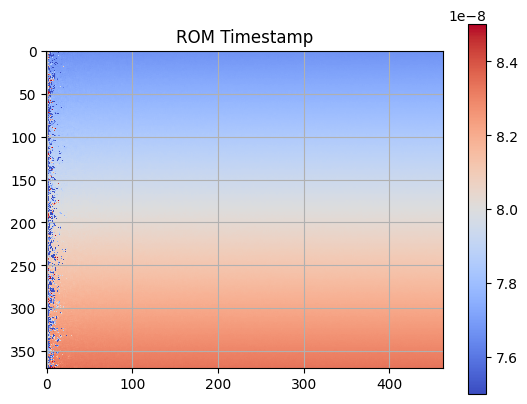

In [302]:
image = test_ts_median_reject
masked_array = np.ma.array(image, mask=np.isinf(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)
plt.imshow(masked_array, interpolation='nearest', cmap=cmap, vmax=8.5E-8, vmin=7.5E-8)
plt.grid()
plt.title("ROM Timestamp")
plt.colorbar()
plt.show()

In [297]:
test_ts_cen_reject = reject_ts(test_ts, test_ts_median_reject, test_alpha, B_test)

/tmp/ipykernel_107978/712273904.py:1: RuntimeWarning: Mean of empty slice
  image = np.nanmean(test_ts_cen_reject, axis=-1)


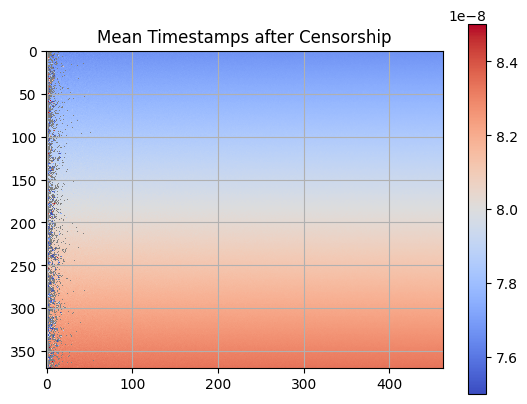

In [303]:
image = np.nanmean(test_ts_cen_reject, axis=-1)
masked_array = np.ma.array(image, mask=np.isinf(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)
plt.imshow(masked_array, interpolation='nearest', cmap=cmap, vmax=8.5E-8, vmin=7.5E-8)
plt.grid()
plt.title("Mean Timestamps after Censorship")
plt.colorbar()
plt.show()

In [305]:
test_z_PML = trial_z(0, 370, 0, 463, test_ts_cen_reject, beta_z=10000)

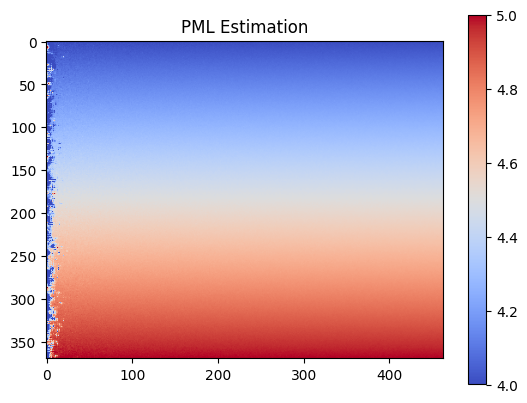

In [307]:
plt.imshow(test_z_PML.x.reshape((370, 463)), cmap=plt.get_cmap("coolwarm"), vmin=4.0, vmax=5.0)
plt.title("PML Estimation")
plt.colorbar()
plt.show()

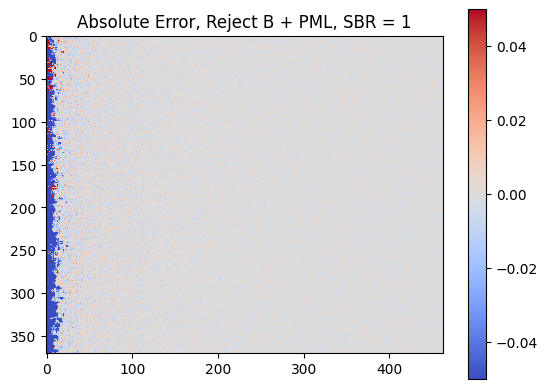

In [353]:
plt.imshow((test_z_PML.x.reshape((370, 463)) - test_z), cmap=plt.get_cmap("coolwarm"), vmin=-0.05, vmax=0.05)
plt.title("Absolute Error, Reject B + PML, SBR = 1")
plt.colorbar()
plt.savefig("abs_err_reject_SBR1.png")
plt.show()

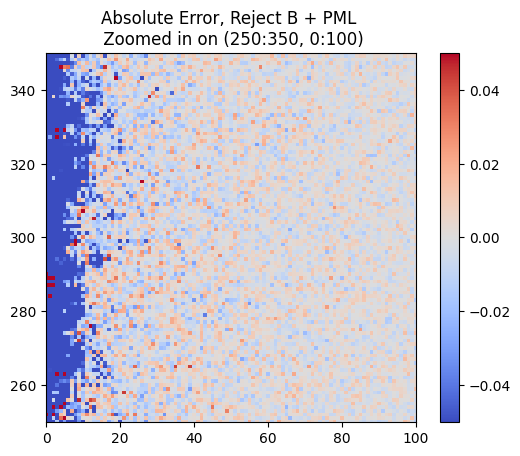

In [352]:
plt.imshow((test_z_PML.x.reshape((370, 463)) - test_z), cmap=plt.get_cmap("coolwarm"), vmin=-0.05, vmax=0.05)
plt.title("Absolute Error, Reject B + PML \n Zoomed in on (250:350, 0:100)")
plt.colorbar()
plt.ylim([250,350])
plt.xlim([0, 100])
plt.savefig("abs_err_reject_SBR1_250350_000100.png")
plt.show()

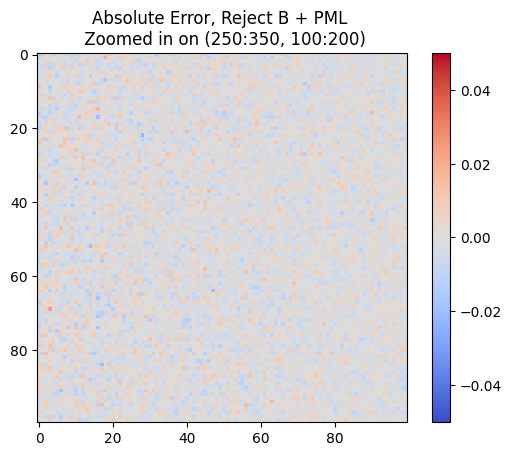

In [336]:
plt.imshow((test_z_PML.x.reshape((370, 463)) - test_z)[250:350, 100:200], cmap=plt.get_cmap("coolwarm"), vmin=-0.05, vmax=0.05)
plt.title("Absolute Error, Reject B + PML \n Zoomed in on (250:350, 100:200)")
plt.colorbar()
plt.savefig("abs_err_reject_SBR1_250350_100200.png")
plt.show()

In [ ]:
plt.imshow((test_z_PML.x.reshape((370, 463)) - test_z), cmap=plt.get_cmap("coolwarm"), vmin=-0.05, vmax=0.05)
plt.title("Absolute Error, Reject B + PML")
plt.colorbar()
# plt.savefig("abs_err_reject_SBR1.png")
plt.show()

In [319]:
depth_RMSE(test_z_PML.x.reshape((370, 463)), test_z)

0.009317404381938513

11 minute 30.9 seconds.
RMSE = 0.932 cm.

(array([ 1.,  1.,  1.,  1.,  1.,  0.,  1.,  1.,  0.,  2.,  0.,  1.,  1.,
         0.,  2.,  0.,  3.,  1.,  0.,  0.,  0.,  1.,  1.,  1.,  0.,  4.,
         1.,  1.,  3.,  2.,  1.,  2.,  3.,  1.,  1.,  0.,  2.,  2.,  3.,
         0.,  2.,  1.,  3.,  2.,  0.,  1.,  2.,  1.,  1.,  1.,  3.,  2.,
         3.,  0.,  0.,  1.,  3., 18.,  2.,  2.,  0.,  2.,  2.,  2.,  2.,
         2.,  1.,  0.,  1.,  1.,  1.,  0.,  2.,  1.,  2.,  1.,  5.,  3.,
         5.,  1.,  2.,  2.,  2.,  1.,  2.,  2.,  3.,  2.,  1.,  1.,  2.,
         1.,  2.,  3.,  0.,  1.,  0.,  1.,  4.,  1.,  3.,  3.,  2.,  1.,
         2.,  2.,  0.,  1.,  1.,  2.,  1.,  2.,  1.,  0.,  3.,  1.,  2.,
         0.,  1.,  1.,  2.,  2.,  2.,  1.,  1.,  1.,  2.,  3.,  3.,  2.,
         0.,  0.,  3.,  1.,  1.,  1.,  2.,  2.,  1.,  2.,  1.,  2.,  0.,
         2.,  0.,  0.,  2.,  4.,  2.,  1.,  1.,  1.,  1.,  1.,  0.,  4.,
         2.,  2.,  2.,  1.,  1.,  2.,  0.,  4.,  1.,  0.,  3.,  1.,  2.,
         2.,  2.,  2.,  2.,  2.,  2.,  1.,  0.,  1.

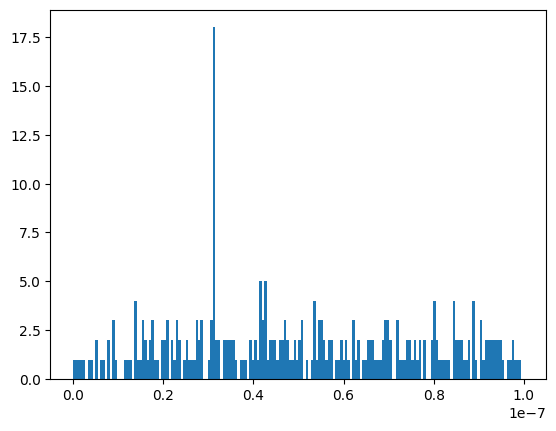

In [151]:
depth_

In [365]:
from scipy.stats.qmc import Sobol


/home/william/.local/lib/python3.10/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


In [518]:
sampler = Sobol(d=1, scramble=False)

In [519]:
sample = sampler.random(390)

/home/william/.local/lib/python3.10/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


In [570]:
285/5

57.0

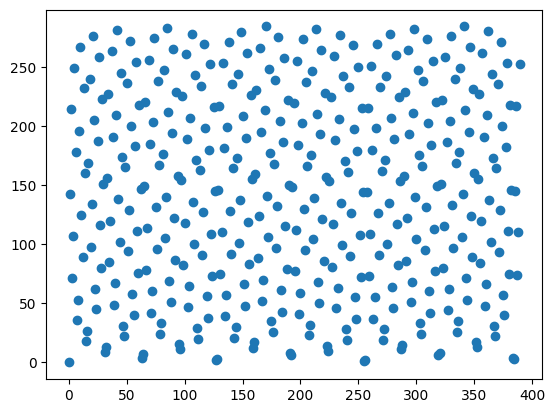

In [520]:
plt.scatter(np.arange(0, 390), np.rint(sample*285))

In [607]:
phi = 1.618
output = np.arange(200, 1307)*phi
output = output % 1

(array([111., 111., 111., 110., 111., 110., 112., 110., 111., 110.]),
 array([0.    , 0.0998, 0.1996, 0.2994, 0.3992, 0.499 , 0.5988, 0.6986,
        0.7984, 0.8982, 0.998 ]),
 <BarContainer object of 10 artists>)

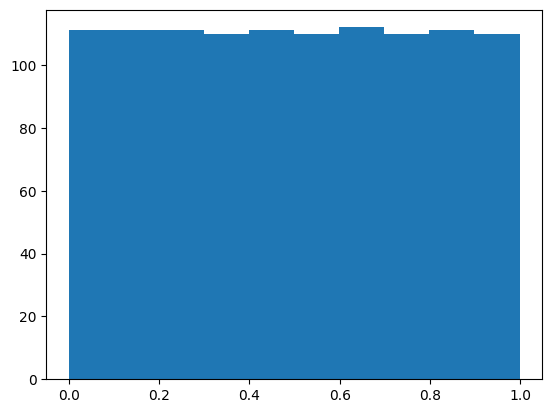

In [608]:
plt.hist(output)

(array([2., 0., 2., 0., 2., 0., 3., 0., 2., 2., 0., 0., 2., 0., 2., 0., 3.,
        0., 3., 1., 1., 0., 2., 0., 2., 0., 2., 0., 3., 0., 2., 0., 2., 0.,
        2., 0., 2., 0., 2., 1., 2., 0., 2., 0., 2., 0., 2., 0., 2., 0., 3.,
        0., 2., 0., 2., 0., 2., 0., 2., 0., 2., 0., 3., 0., 2., 0., 2., 0.,
        2., 0., 2., 0., 3., 0., 3., 0., 2., 0., 2., 0., 2., 0., 2., 0., 3.,
        0., 2., 0., 2., 0., 2., 0., 2., 0., 2., 0., 3., 0., 2., 0., 2., 0.,
        2., 0., 2., 2., 1., 0., 3., 0., 2., 0., 2., 0., 2., 1., 1., 0., 3.,
        0., 2., 0., 2., 0., 2., 0., 2., 0., 2., 0., 3., 0., 2., 0., 2., 0.,
        2., 0., 2., 0., 3., 0., 2., 0., 2., 0., 2., 0., 2., 0., 2., 0., 3.,
        2., 0., 0., 2., 0., 2., 0., 2., 0., 3., 1., 2., 0., 2., 0., 2., 0.,
        2., 0., 2., 1., 2., 0., 2., 1., 1., 0., 2., 0., 2., 1., 1., 0., 3.,
        1., 1., 0., 2., 0., 2., 1., 1., 0., 3., 0., 2., 0., 2., 2., 0., 0.,
        2., 0., 2., 0., 3., 0., 2., 2., 0., 0., 2., 0., 2., 0., 3., 0., 3.,
        1., 

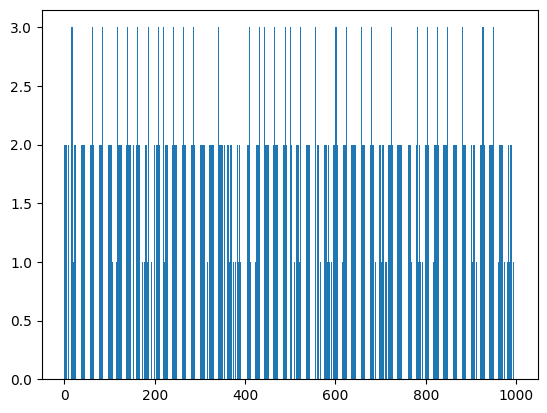

In [610]:
plt.hist(np.floor(output*1000), bins=1000)

In [598]:
test_test = test_ts.copy()

In [599]:
i = 200
j = 10
test_test = test_test - T_r/2 # calcuate the time that is relative to the nearest pulse sent
test_test = test_test % T_r # we don't want negative time, fix everything into range of [0, T_r]
test_test = test_test + T_r/2 # such that the pulse is centered at T_r/2 again

neighbor = np.concatenate((test_test[i-1][j-1:j+2], 
                            test_test[i][j-1:j], 
                            test_test[i][j+1:j+2], 
                            test_test[i+1][j-1:j+2]))
neighbor = neighbor.flatten()

In [600]:
len(neighbor)

1600

In [547]:
mode(np.round(neighbor_valid_sorted, decimals=10)).mode

3.11e-08

In [537]:
test_z[200, 10]*2/c

3.028003613369467e-08

In [540]:
1E-3*2/c

6.666666666666667e-12

In [531]:
2*T_p

2.7e-10

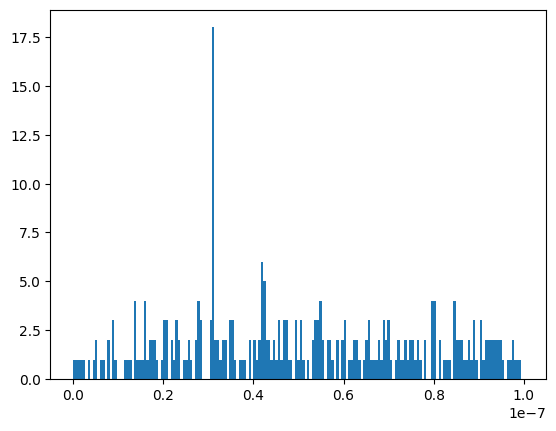

In [522]:
plt.hist(neighbor_valid, bins=np.linspace(0, T_r, 186))
plt.show()

In [523]:
neighbor_valid_sorted = np.sort(neighbor_valid)

In [589]:
neighbor_valid_deleted = np.delete(neighbor_valid_sorted, np.rint(output*284).astype(int))

In [590]:
len(neighbor_valid_deleted)

91

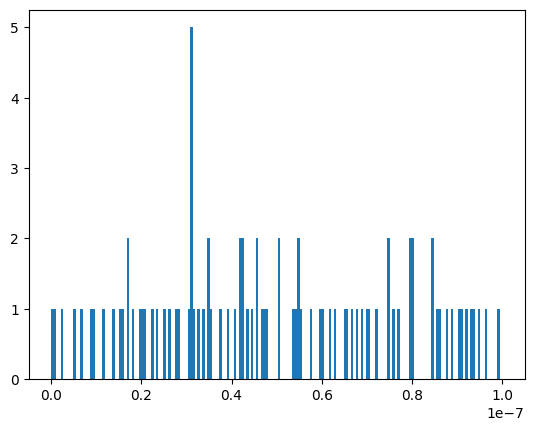

In [591]:
plt.hist(neighbor_valid_deleted, bins=np.linspace(0, T_r, 186))
plt.show()

In [516]:
len(neighbor_valid_deleted)

25

In [592]:
np.median(neighbor_valid_deleted)

4.57245291705586e-08

In [429]:
np.median(neighbor_valid_sorted[np.rint(sample*285).astype(int)])

4.1628196173012604e-08

In [364]:
len(neighbor_valid)

285

In [246]:
np.fft.fft(neighbor_valid)

(1.4368054846041973e-05+0j)

In [247]:
np.fft.ifft(np.fft.fft(neighbor_valid)[0])

IndexError: tuple index out of range

In [154]:
np.linspace(0, T_r, 185)[int(np.argmax(n))]

3.804347826086957e-09

In [138]:
len(neighbor_valid)

285

In [139]:
int(np.round(8*B_test*200))

280

In [258]:
random_choose_S = []
for i in range(len(neighbor_valid)):
    rand_num = np.random.uniform()
    if rand_num>0.8:
        random_choose_S.append(neighbor_valid[i])

In [260]:
np.median(neighbor_valid)

4.743901717304837e-08

In [259]:
np.median(random_choose_S)

4.535952729772167e-08

In [252]:
B_test/(B_test + test_alpha[i, j]*eta*S)

0.9585062240663901

In [253]:
np.random.uniform()

0.6225611725685707

In [ ]:
2.83

In [267]:
for i in range(0, 15):
    print("Choose ", 285-20*i)
    random_reject_B = np.random.choice(neighbor_valid, 285-290, replace=False)
    print(np.median(random_reject_B))

Choose  285


ValueError: Negative dimensions are not allowed

(array([ 5.,  2.,  2.,  7.,  7.,  8.,  4., 10.,  7.,  5.,  9.,  8.,  7.,
         9.,  5.,  3.,  7.,  5.,  3.,  6.,  8.,  7.,  6.,  5.]),
 array([0.00000000e+00, 4.16666667e-09, 8.33333333e-09, 1.25000000e-08,
        1.66666667e-08, 2.08333333e-08, 2.50000000e-08, 2.91666667e-08,
        3.33333333e-08, 3.75000000e-08, 4.16666667e-08, 4.58333333e-08,
        5.00000000e-08, 5.41666667e-08, 5.83333333e-08, 6.25000000e-08,
        6.66666667e-08, 7.08333333e-08, 7.50000000e-08, 7.91666667e-08,
        8.33333333e-08, 8.75000000e-08, 9.16666667e-08, 9.58333333e-08,
        1.00000000e-07]),
 <BarContainer object of 24 artists>)

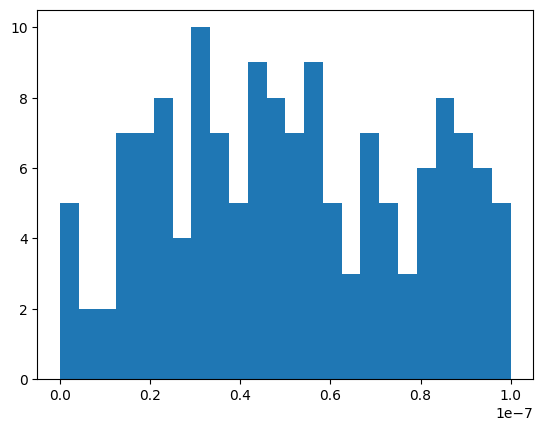

In [147]:
plt.hist(random_reject_B, bins=np.linspace(0, T_r, 25))

## 4. Find mode

## 2. Calculate Timestamp Differences

This method only works if we assume the signal detections are closer packed together than the background detections. <br> We know that for signal detections, they are assumed to stay within a packet size of $T_p$.

In [31]:
def smallest_diff_1d(difference):
    
    # ts_sorted = np.sort(ts, axis=-1)
    # difference = np.diff(ts_sorted, append=np.nan)
    difference = difference[~np.isnan(difference)]
    if len(difference) == 0:
        return 0
    elif len(difference) <= 3:
        return np.nanargmin(difference)
    convolved = np.convolve(difference, [1, 1, 1], 'valid')
    return np.nanargmin(convolved)

vsmallest_diff = np.vectorize(smallest_diff_1d, signature='(n)->()')


In [94]:
art_alpha_avg

0.3839074938474657

In [101]:
for i in sppp_arr:
    print(T_r/(i*500*find_B(art_alpha_avg, 0.1))/(2*T_p))

483.5782354644223
241.78911773221114
138.16521013269207
80.5963725774037
48.357823546442226
24.178911773221113
13.816521013269206
8.05963725774037
4.8357823546442225


In [96]:
2*T_p

2.7e-10

In [33]:
col_idx = np.outer(np.ones((557)), np.arange(628)).astype(np.intp)
row_idx = np.outer(np.arange((557)), np.ones(628)).astype(np.intp)

In [42]:
def compute_tightest(ts):
    start_time = time.time()
    ts_padded = np.pad(ts, [(1, 1), (1, 1), (0, 0)], mode='constant', constant_values=np.nan)

    i_min_1_j_min_1 = np.roll(ts_padded, (1, 1), axis=(0, 1))
    i_min_1 = np.roll(ts_padded, (1, 0), axis=(0, 1))
    i_min_1_j_add_1 = np.roll(ts_padded, (1, -1), axis=(0, 1))
    j_min_1 = np.roll(ts_padded, (0, 1), axis=(0, 1))
    # iij = np.roll(arr, (1, 0), axis=(0, 1))
    j_add_1 = np.roll(ts_padded, (0, -1), axis=(0, 1))
    i_add_1_j_min_1 = np.roll(ts_padded, (-1, 1), axis=(0, 1))
    i_add_1 = np.roll(ts_padded, (-1, 0), axis=(0, 1))
    i_add_1_j_add_1 = np.roll(ts_padded, (-1, -1), axis=(0, 1))
    concated = np.concatenate((i_min_1_j_min_1, i_min_1, i_min_1_j_add_1, 
                                    j_min_1, j_add_1, 
                                    i_add_1_j_min_1, i_add_1, i_add_1_j_add_1), axis=-1)
    concated_sorted = np.sort(concated)
    concated_diff = np.diff(concated_sorted, axis=-1, append=np.nan)
    concated_diff = np.where(concated_diff<2*T_p*2, concated_diff, np.nan)
    ts_tightest_idx = vsmallest_diff(concated_diff)
    # print(ts_tightest_idx.shape)

    print(time.time() - start_time)
    
    return concated_sorted[row_idx, col_idx, ts_tightest_idx][1:-1, 1:-1]
    
    

In [36]:
ts_tightest = compute_tightest(ts)

10.703431367874146


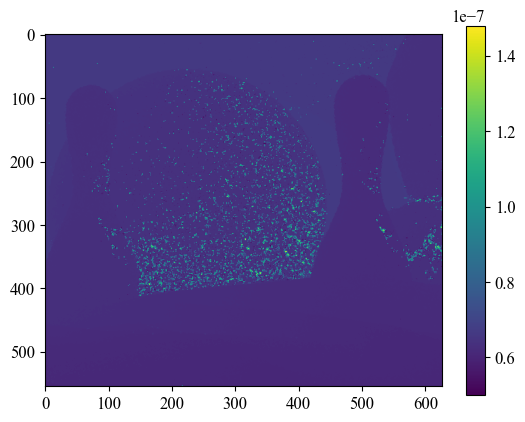

In [86]:
image = ts_tightest
masked_array = np.ma.array(image, mask=np.isnan(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)

plt.imshow(image)
plt.colorbar()
plt.show()

In [43]:
ts_tightest_new = compute_tightest(ts)

10.706009149551392


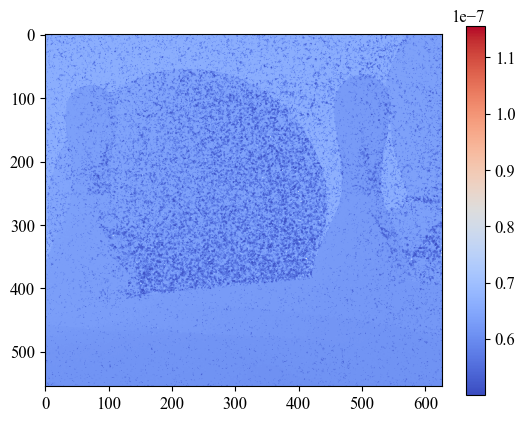

In [67]:
image = ts_tightest_new
masked_array = np.ma.array(image, mask=np.isnan(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)


plt.imshow(image, cmap=cmap)
plt.colorbar()
plt.show()

In [45]:
def reject_ts_tight(ts_m, ts_ROM, alpha_PML, sbr):
    N = len(ts_m[0][0])
    B = find_B(alpha_PML, sbr)
    start_time = time.time() # start timing
    

    return_ts_cen = np.empty_like(ts_m)
    # return_ts_cen.fill(np.nan)

    for k in range(N):
        diff = np.abs(ts_m[:,:,k] - ts_ROM) # |t - tROM|
        criterion = 2*(T_p*2)*(B*sbr/(eta*alpha_PML*S+B)) # see note below for T_p*2
        # criterion = 2*(T_p*2)
        return_ts_cen[:,:,k] = np.where(diff < criterion, ts_m[:,:,k], np.nan)
    T = time.time() - start_time # calculate the time required for convergence
    print("censoring used = ", T)
    return return_ts_cen


In [50]:
test_ts_cen_tight = reject_ts_tight(ts, ts_tightest_new, bowl_alpha, 1.0)

censoring used =  0.14437508583068848


/tmp/ipykernel_107001/3490366289.py:1: RuntimeWarning: Mean of empty slice
  plt.imshow(np.nanmean(test_ts_cen_tight, axis=-1))


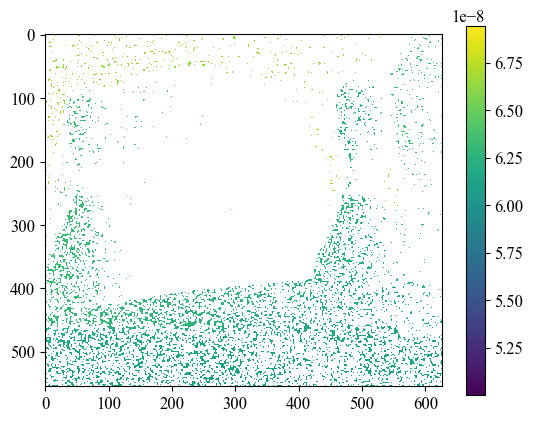

In [83]:
plt.imshow(np.nanmean(test_ts_cen_tight, axis=-1))
plt.colorbar()

In [68]:
tight_ig = calculate_initial_guess(ts_tightest_new)
plt.imshow(tight_ig)
plt.colorbar()

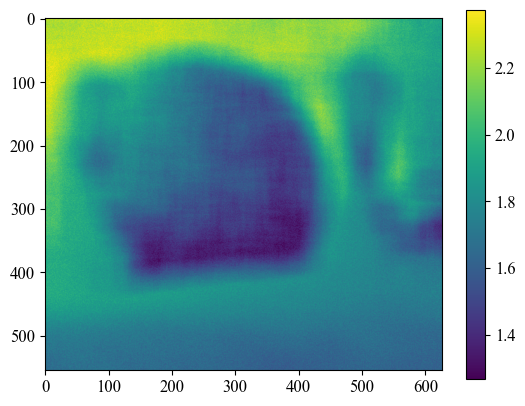

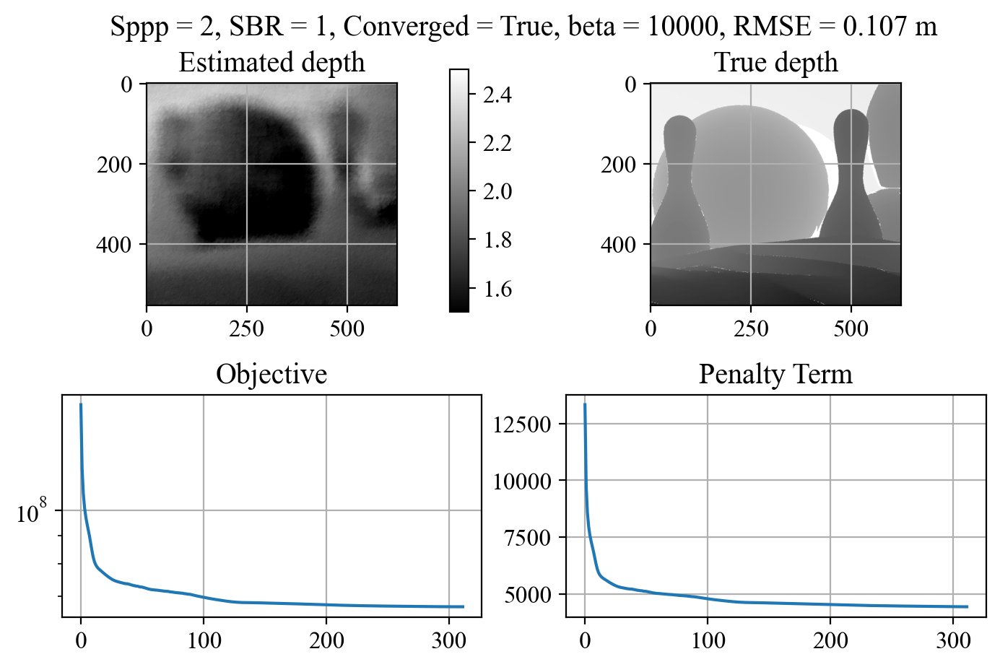

In [70]:
tight_result = trial_z(test_ts_cen_tight, tight_ig, SBR=1, beta_z=10000, ftol=1E-5)

In [73]:
def smallest_diff_1d_log(difference):
    
    # ts_sorted = np.sort(ts, axis=-1)
    # difference = np.diff(ts_sorted, append=np.nan)
    difference = difference[~np.isnan(difference)]
    if len(difference) == 0:
        return 0
    elif len(difference) <= 3:
        return np.nanargmax(difference)
    convolved = np.convolve(difference, [1, 1, 1], 'valid')
    return np.nanargmax(convolved)

vsmallest_diff_log = np.vectorize(smallest_diff_1d_log, signature='(n)->()')


In [74]:
def compute_tightest_log(ts):
    start_time = time.time()
    ts_padded = np.pad(ts, [(1, 1), (1, 1), (0, 0)], mode='constant', constant_values=np.nan)

    i_min_1_j_min_1 = np.roll(ts_padded, (1, 1), axis=(0, 1))
    i_min_1 = np.roll(ts_padded, (1, 0), axis=(0, 1))
    i_min_1_j_add_1 = np.roll(ts_padded, (1, -1), axis=(0, 1))
    j_min_1 = np.roll(ts_padded, (0, 1), axis=(0, 1))
    # iij = np.roll(arr, (1, 0), axis=(0, 1))
    j_add_1 = np.roll(ts_padded, (0, -1), axis=(0, 1))
    i_add_1_j_min_1 = np.roll(ts_padded, (-1, 1), axis=(0, 1))
    i_add_1 = np.roll(ts_padded, (-1, 0), axis=(0, 1))
    i_add_1_j_add_1 = np.roll(ts_padded, (-1, -1), axis=(0, 1))
    concated = np.concatenate((i_min_1_j_min_1, i_min_1, i_min_1_j_add_1, 
                                    j_min_1, j_add_1, 
                                    i_add_1_j_min_1, i_add_1, i_add_1_j_add_1), axis=-1)
    concated_sorted = np.sort(concated)
    concated_diff = np.diff(concated_sorted, axis=-1, append=np.nan)
    concated_diff = np.where(concated_diff<2*T_p*2, np.log(1 + concated_diff), np.nan)
    ts_tightest_idx = vsmallest_diff_log(concated_diff)
    # print(ts_tightest_idx.shape)

    print(time.time() - start_time)
    
    return concated_sorted[row_idx, col_idx, ts_tightest_idx][1:-1, 1:-1]
    
    

In [75]:
ts_tightest_log = compute_tightest_log(ts)

11.283151388168335


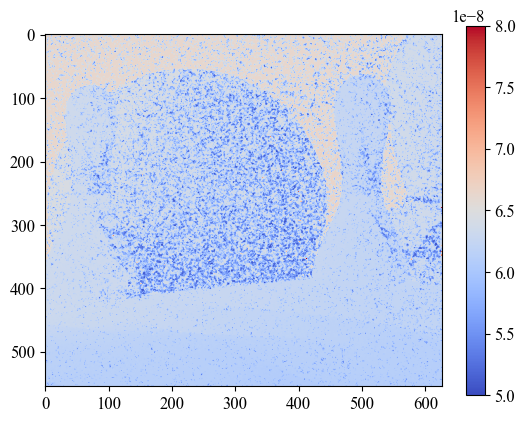

In [88]:
image = ts_tightest_new
masked_array = np.ma.array(image, mask=np.isnan(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)


plt.imshow(image, cmap=cmap, vmin=T_r/2, vmax=0.8E-7)
plt.colorbar()
plt.show()

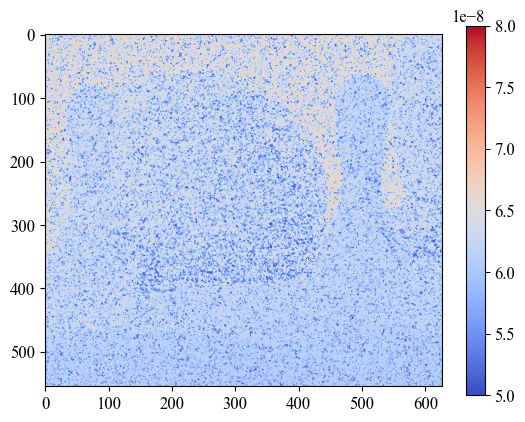

In [87]:
image = ts_tightest_log
masked_array = np.ma.array(image, mask=np.isnan(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)


plt.imshow(image, cmap=cmap, vmin=T_r/2, vmax=0.8E-7)
plt.colorbar()
plt.show()

In [77]:
test_ts_cen_tight_log = reject_ts_tight(ts, ts_tightest_log, bowl_alpha, 1.0)

censoring used =  0.21360516548156738


/tmp/ipykernel_107001/2798904656.py:1: RuntimeWarning: Mean of empty slice
  image = np.nanmean(test_ts_cen_tight_log, axis=-1)


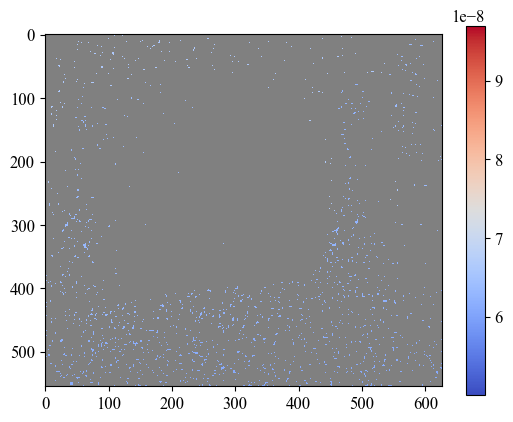

In [82]:
image = np.nanmean(test_ts_cen_tight_log, axis=-1)
masked_array = np.ma.array(image, mask=np.isnan(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)


plt.imshow(image, cmap=cmap)
plt.colorbar()
plt.show()

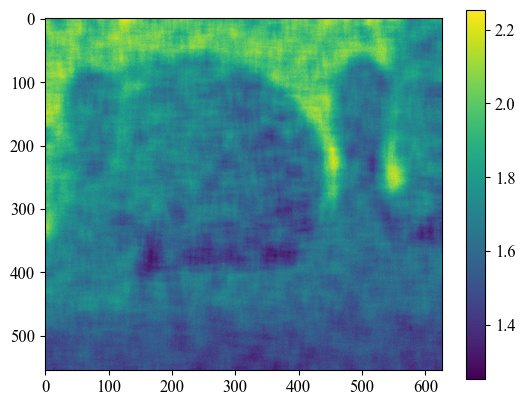

In [84]:
tight_ig_log = calculate_initial_guess(ts_tightest_log)
plt.imshow(tight_ig_log)
plt.colorbar()

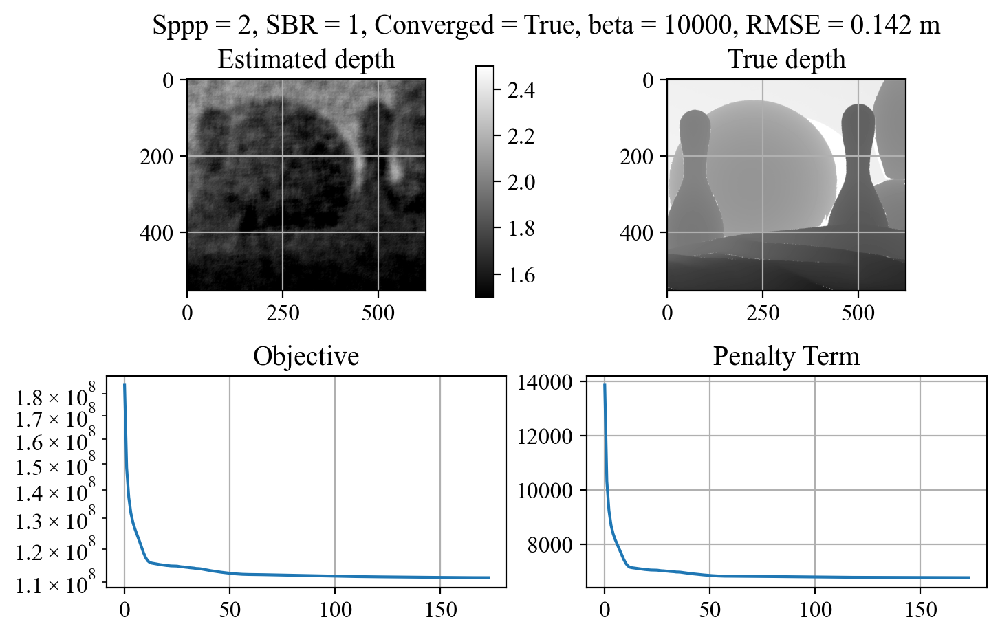

In [85]:
tight_result_log = trial_z(test_ts_cen_tight_log, tight_ig_log, SBR=1, beta_z=10000, ftol=1E-5)

# Mode

In [562]:
def compute_mode(ts):
    ts_padded = np.pad(ts, [(1, 1), (1, 1), (0, 0)], mode='constant', constant_values=np.nan)
    ts_padded = ts_padded - T_r/2 # calcuate the time that is relative to the nearest pulse sent
    ts_padded = ts_padded % T_r # we don't want negative time, fix everything into range of [0, T_r]
    ts_padded = ts_padded + T_r/2 # such that the pulse is centered at T_r/2 again
    row_num = len(ts_padded)
    col_num = len(ts_padded[0])
    ts_mode = np.empty((row_num - 2, col_num - 2))
    ts_mode.fill(np.inf)
    for i in range(1, row_num - 1):
        for j in range(1, col_num - 1):
            neighbor = np.concatenate((ts_padded[i-1][j-1:j+2], 
                                        ts_padded[i][j-1:j], 
                                        ts_padded[i][j+1:j+2], 
                                        ts_padded[i+1][j-1:j+2]))
            neighbor = neighbor.flatten()

            modeij = mode(np.round(neighbor, decimals=10), nan_policy='omit').mode            
            if modeij == None:
                modeij = np.inf
            ts_mode[i - 1, j - 1] = modeij

    return ts_mode
    

In [563]:
test_ts_mode = compute_mode(test_ts)

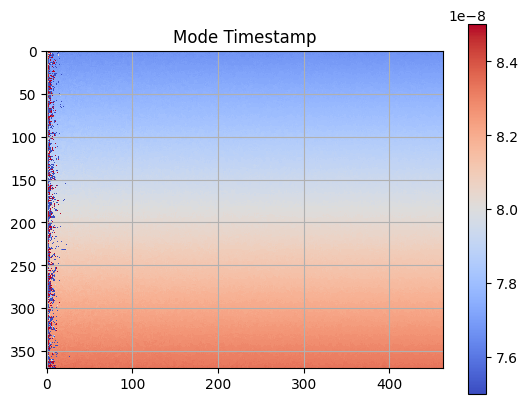

In [566]:
image = test_ts_mode
masked_array = np.ma.array(image, mask=np.isinf(image))
cmap = plt.get_cmap('coolwarm')
cmap.set_bad('grey',1.)
plt.imshow(masked_array, interpolation='nearest', cmap=cmap, vmin=7.5E-8, vmax=8.5E-8)
plt.grid()
plt.title("Mode Timestamp")
plt.colorbar()
plt.show()

In [618]:
c*0.5E-10/2

0.007500000000000001

In [567]:
test_ts_mode_cen = reject_ts(test_ts, test_ts_mode, test_alpha, B_test)

In [568]:
test_z_PML_mode = trial_z(0, 370, 0, 463, test_ts_mode_cen, beta_z=10000)

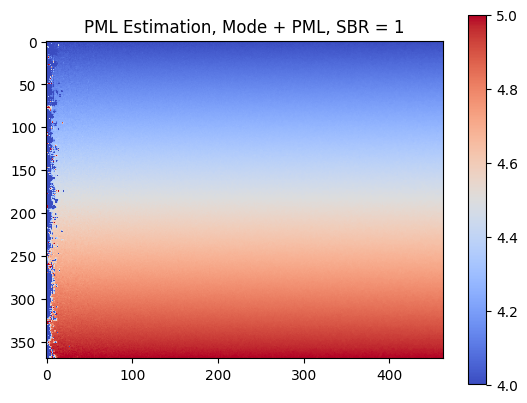

In [619]:
plt.imshow(test_z_PML_mode.x.reshape((370, 463)), cmap=plt.get_cmap("coolwarm"), vmin=4.0, vmax=5.0)
plt.title("PML Estimation, Mode + PML, SBR = 1")
plt.colorbar()
plt.savefig("abs_err_mode_SBR1.png")
plt.show()

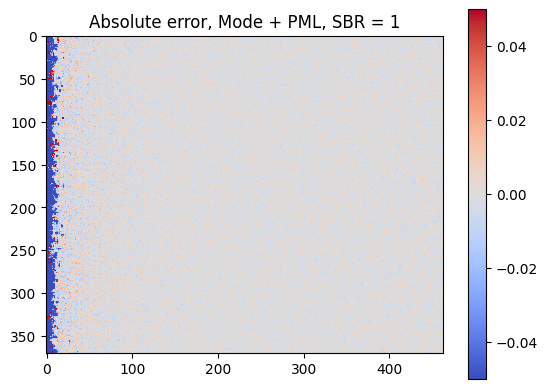

In [620]:
plt.imshow(test_z_PML_mode.x.reshape((370, 463)) - test_z, cmap=plt.get_cmap("coolwarm"), vmin=-0.05, vmax=0.05)
plt.title("Absolute error, Mode + PML, SBR = 1")
plt.colorbar()
plt.savefig("abs_err_mode_SBR1.png")
plt.show()

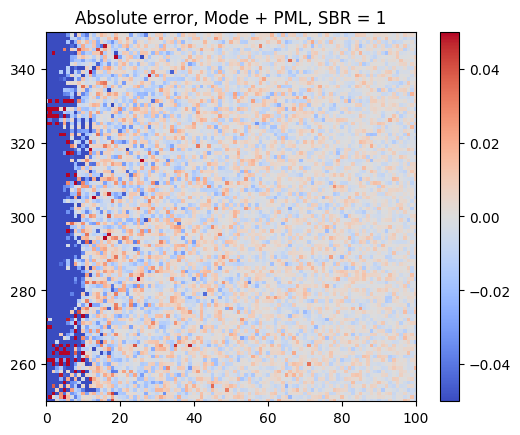

In [621]:
plt.imshow(test_z_PML_mode.x.reshape((370, 463)) - test_z, cmap=plt.get_cmap("coolwarm"), vmin=-0.05, vmax=0.05)
plt.title("Absolute error, Mode + PML, SBR = 1")
plt.ylim([250,350])
plt.xlim([0,100])
plt.colorbar()
plt.savefig("abs_err_mode_SBR1_250350_000100.png")
plt.show()

In [594]:
depth_RMSE(test_z_PML_mode.x.reshape((370, 463)), test_z)

0.045181378581714324

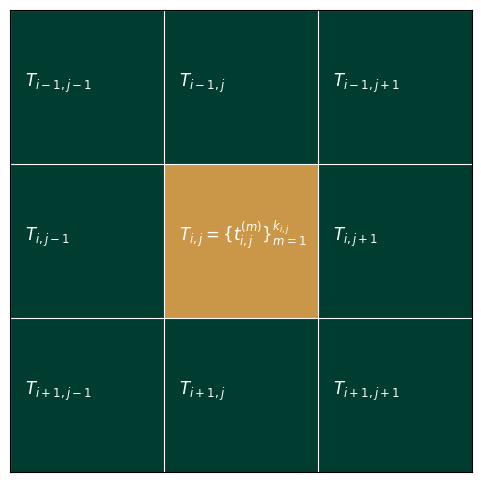

In [137]:
plt.figure(figsize=(6, 6))
plt.imshow(np.array([[1, 1, 1], [1, 0, 1], [1, 1, 1]])/3, cmap=plt.get_cmap("BrBG"), vmax=0.32, vmin=-0.1)
plt.xticks(np.arange(-0.5, 2.5, 1) ,[])
plt.yticks(np.arange(-0.5, 2.5, 1), [])
plt.tick_params(axis='both', 
                left=False, 
                top=False, 
                right=False, 
                bottom=False, 
                labelleft=False, 
                labeltop=False, 
                labelright=False, 
                labelbottom=False)
plt.text(0.6, 1, r"$T_{i, j}= \{t_{i, j}^{(m)}\}_{m=1}^{k_{i, j}}$", color="white")
plt.text(0.6, 0, r"$T_{i - 1, j}$", color="white")
plt.text(0.6, 2, r"$T_{i + 1, j}$", color="white")
plt.text(1.6, 0, r"$T_{i - 1, j + 1}$", color="white")
plt.text(1.6, 1, r"$T_{i, j + 1}$", color="white")
plt.text(1.6, 2, r"$T_{i + 1, j + 1}$", color="white")
plt.text(-0.4, 0, r"$T_{i - 1, j - 1}$", color="white")
plt.text(-0.4, 1, r"$T_{i, j - 1}$", color="white")
plt.text(-0.4, 2, r"$T_{i + 1, j - 1}$", color="white")
plt.grid(c="white")
plt.savefig("paper_graph/ROM_explain.png", bbox_inches="tight")


# Speed Comparison with Rapp

In [138]:
400E-6 / T_r

4000.0000000000005